In [1]:
## Importando librerias
import xarray as xr
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np
import scipy.stats                       #  calcula estadísticos como correlaciones entre otros
from scipy.stats import iqr              #  calcula el rango intercuartil (Interquartile Range (IQR))
import scipy.stats as scp
from mpl_toolkits.basemap import Basemap #  Crear mapas

In [2]:
ruta = "/Users/moise/Desktop/DATOS AMBIENTALES/Modulo 2/"
ruta_figuras ="/Users/moise/Desktop/DATOS AMBIENTALES/Modulo 2/Figuras/"

### STA "gistemp1200_ERSSTv5.nc"
         ## 'tempanomaly'
         ## 'lat'
         ## 'lon'
### PPT "precip.mon.mean.nc"
         ## 'tempanomaly'
         ## 'lat'
         ## 'lon'

temp = "gistemp1200_ERSSTv5.nc"              
precip = "precip.mon.mean.nc"

In [3]:
tempXR = xr.open_dataset(ruta + temp)
precipXR = xr.open_dataset(ruta + precip)

#print(tempXR.keys())
#print(precipXR.keys())
#tempXR.dims
#aa = tempXR["tempanomaly"].sel(time=datetime(1988, 3, 15)).values
#print(aa)

In [4]:
#### Temperatura - Filtrando por ds
mediaTemp = tempXR['tempanomaly'].mean(dim=['time', 'lat', 'lon'])
desviacionTemp = tempXR['tempanomaly'].std(dim=['time', 'lat', 'lon'])

threshold = 2
mediaLimiteSuperior = mediaTemp + threshold * desviacionTemp
mediaLimiteInferior = mediaTemp - threshold * desviacionTemp

# Filtrar los valores basados en la desviación estándar
tempanomalyFiltrado = tempXR['tempanomaly'].where((tempXR['tempanomaly'] >= mediaLimiteInferior) & (tempXR['tempanomaly'] <= mediaLimiteSuperior), drop=True)

In [5]:
### Tener en cuenta
#aa = tempanomalyFiltrado.sel(time=datetime(1988, 3, 15)).values.flatten()
#nobs, bins, patches = plt.hist(aa, bins=60, density=False, alpha=0.5)
#plt.show()
#print (nobs)
#print (bins)

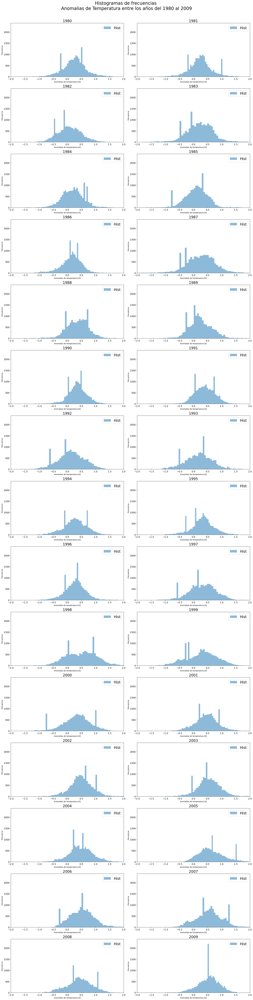

In [52]:
#### Temperatura - Histogramas ANUAL

### Rango de años
añoInicio = 1980
añoFin = 2009

## Preparación para PDF
temp_nobs = []
temp_bins = []

####################################

### Configuraciones para el subplot
filas = 15
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 80))

# Iterar sobre los años y generar los histogramas en los subplots correspondientes
for i, año in enumerate(range(añoInicio, añoFin + 1)):
    # Obtener los datos para el año especificado
    #especifico = tempanomalyFiltrado.sel(time=datetime(año, 1, 15)).values.flatten()  #Imprime determinado un mes del año
    especifico = tempanomalyFiltrado.sel(time=str(año)).mean(dim='time').values.flatten()
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    # Crear el histograma en el subplot correspondiente
    nobs, bins, patches = axs[fila, columna].hist(especifico, bins = 60, density=False, alpha=0.5)
    
    #################################
    temp_nobs.append(nobs)
    temp_bins.append(bins)
    #################################
    
    axs[fila, columna].set_title(str(año), fontsize=20)
    
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([-2, 2])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 2400])  # Establecer límites del eje y
    
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=13)
    
    # Agregar leyenda al subplot actual
    axs[fila, columna].legend(['Hist'], fontsize=20)

    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Anomalías de temperatura [K]")  # Nombre del eje x
    axs[fila, columna].set_ylabel("Frecuencia")  # Nombre del eje y

# Estipular el título superior de la figura
fig.suptitle('Histogramas de frecuencias \n Anomalias de Temperatura entre los años del {} al {} \n \n \n \n \n'.format(añoInicio, añoFin), fontsize=25,va='top')

# Ajustar el espaciado entre los subplots
fig.tight_layout()

# Nombre de archivo para la figura
nombre_figura = "TempHistoFrec.png"

# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)


# Mostrar la figura
plt.show()

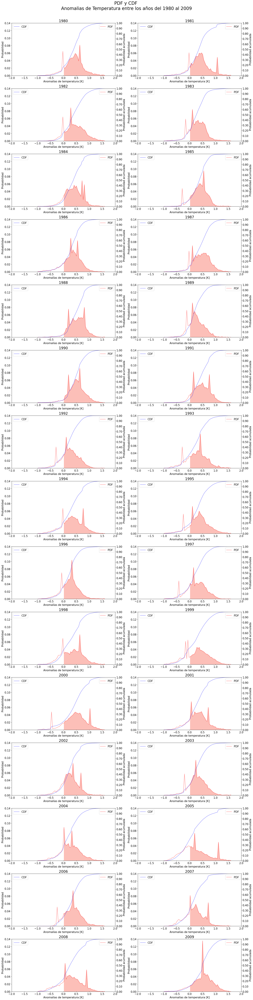

In [54]:
#### Temperatura - PDF y CDF ANUAL

### Rango de años
añoInicio = 1980
añoFin = 2009

## Listas vacías

### Configuraciones para el subplot
filas = 15
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 80))

# Iterar sobre los años y generar los histogramas en los subplots correspondientes
for i, año in enumerate(range(añoInicio, añoFin + 1)):
    # Obtener los datos para el año especificado
    pdf = temp_nobs[i]/sum(temp_nobs[i])
    cdf = np.cumsum(pdf[:])
    
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    
    # Graficar el PDF
    axs[fila, columna].plot(bins[:-1], pdf, "r-", alpha=0.5)
    
    # Titulo para cada grafica
    axs[fila, columna].set_title(str(año), fontsize=20)
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([-2, 2])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 0.14])  # Establecer límites del eje y
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=15)
    # Agregar leyenda al subplot actual
    legend1 = axs[fila, columna].legend(['PDF'], fontsize=15, loc = "upper right")
    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Anomalías de temperatura [K]", fontsize=15)  # Nombre del eje x
    axs[fila, columna].set_ylabel("Probabilidad", fontsize=15)  # Nombre del eje y
    
    # Clonando eje y en la izq  
    axs2 = axs[fila, columna].twinx()
    axs2.plot(bins[:-1], cdf, "b-", alpha=0.5)
    # Estipular tamaño del eje
    axs2.set_ylim([0, 1])
    #
    axs2.set_yticks(np.arange(0, 1.1, 0.1))
    axs2.set_yticklabels([f"{i:.2f}" for i in np.arange(0, 1.1, 0.1)], rotation=0)
    # Estipular nombre del eje
    axs2.set_ylabel("Probabilidad acumulada", fontsize=15)
    axs2.tick_params(axis='y', labelsize=15)
    # Agregar leyenda al subplot actual
    legend2 = axs2.legend(["CDF"], fontsize = 15, loc = "upper left")


    umbralProb = 0
    dondeFill  = tuple([bins[:-1] >= umbralProb])
    probab     = round(np.sum(np.array(pdf)[dondeFill]), 2)
    axs[fila, columna].fill_between(bins[:-1][dondeFill],np.array(pdf)[dondeFill] ,  alpha=0.5,facecolor='salmon', edgecolor='salmon')

# Estipular el título superior de la figura
fig.suptitle('PDF y CDF \n Anomalias de Temperatura entre los años del 1980 al 2009 \n \n \n \n \n', fontsize=25,va='top')

# Ajustar el espaciado entre los subplots
fig.tight_layout()

# Nombre de archivo para la figura
nombre_figura = "TempPDF_CDF.png"

# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)

# Mostrar la figura
plt.show()

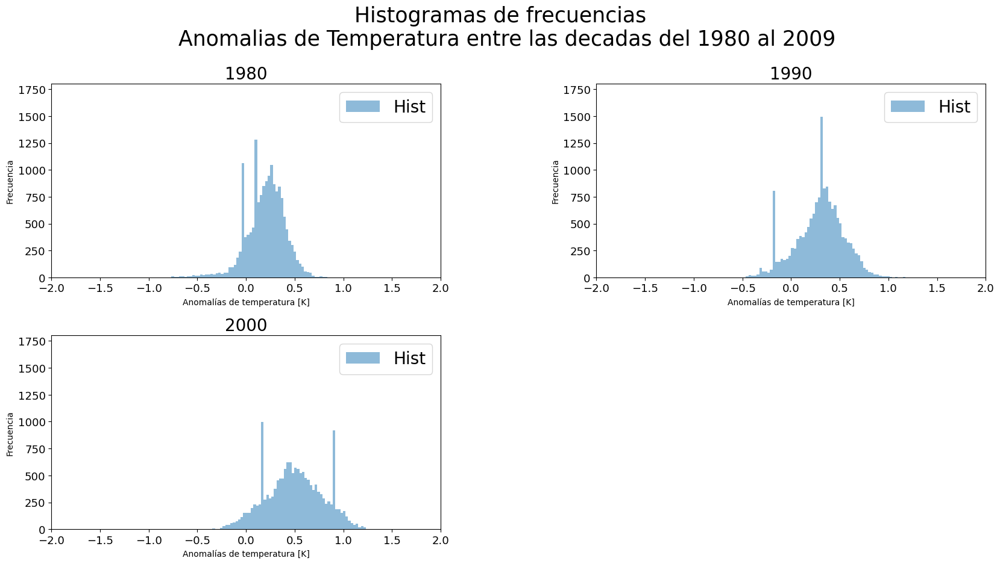

In [80]:
#### Temperatura - Histogramas DECADA

### Rango de años
años = [1980, 1990, 2000]

## Preparación para PDF
temp_nobs = []
temp_bins = []

####################################

### Configuraciones para el subplot
filas = 2
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 10))

for i in range(len(años)):
    # Obtener los datos para la década especificada
    datos_decada = tempanomalyFiltrado.sel(time=slice(str(años[i]), str(años[i]+9)))
    
    # Calcular el promedio de la década
    promedio_decada = datos_decada.mean(dim='time').values.flatten()
    
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    # Crear el histograma en el subplot correspondiente
    nobs, bins, patches = axs[fila, columna].hist(promedio_decada, bins = 60, density=False, alpha=0.5)
    
    #################################
    temp_nobs.append(nobs)
    temp_bins.append(bins)
    #################################
    
    axs[fila, columna].set_title(str(años[i]), fontsize=20)
    
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([-2, 2])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 1800])  # Establecer límites del eje y
    
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=13)
    
    # Agregar leyenda al subplot actual
    axs[fila, columna].legend(['Hist'], fontsize=20)

    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Anomalías de temperatura [K]")  # Nombre del eje x
    axs[fila, columna].set_ylabel("Frecuencia")  # Nombre del eje y

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.3, wspace=0.4, top=0.85)

# Ocultar el subplot de la fila 2 columna 2
axs[1, 1].set_visible(False)

# Estipular el título superior de la figura
fig.suptitle('Histogramas de frecuencias \n Anomalias de Temperatura entre las decadas del {} al {}'.format(años[0], años[-1]+9), fontsize=25,va='top')

# Nombre de archivo para la figura
nombre_figura = "TempHistoFrec_DECADA.png"

# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)



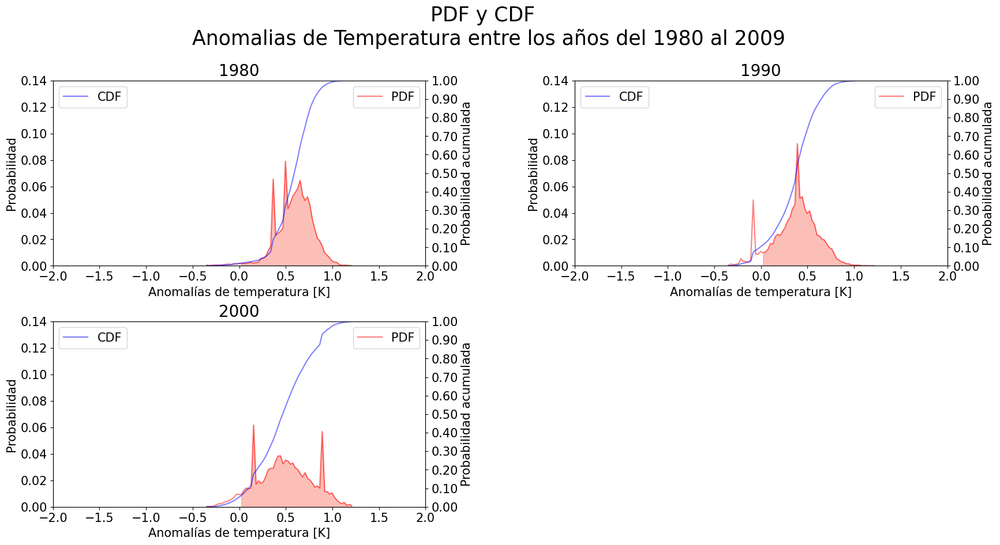

In [81]:
#### Temperatura - Histogramas DECADA

### Rango de años
años = [1980, 1990, 2000]

## Listas vacías

### Configuraciones para el subplot
filas = 2
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 10))

for i in range(len(años)):
    # Obtener los datos para la década especificada
    pdf = temp_nobs[i]/sum(temp_nobs[i])
    cdf = np.cumsum(pdf[:])
    
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    
    # Graficar el PDF
    axs[fila, columna].plot(bins[:-1], pdf, "r-", alpha=0.5)
    
    # Titulo para cada grafica
    axs[fila, columna].set_title(str(años[i]), fontsize=20)
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([-2, 2])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 0.14])  # Establecer límites del eje y
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=15)
    # Agregar leyenda al subplot actual
    legend1 = axs[fila, columna].legend(['PDF'], fontsize=15, loc = "upper right")
    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Anomalías de temperatura [K]", fontsize=15)  # Nombre del eje x
    axs[fila, columna].set_ylabel("Probabilidad", fontsize=15)  # Nombre del eje y
    
    # Clonando eje y en la izq  
    axs2 = axs[fila, columna].twinx()
    axs2.plot(bins[:-1], cdf, "b-", alpha=0.5)
    # Estipular tamaño del eje
    axs2.set_ylim([0, 1])
    #
    axs2.set_yticks(np.arange(0, 1.1, 0.1))
    axs2.set_yticklabels([f"{i:.2f}" for i in np.arange(0, 1.1, 0.1)], rotation=0)
    # Estipular nombre del eje
    axs2.set_ylabel("Probabilidad acumulada", fontsize=15)
    axs2.tick_params(axis='y', labelsize=15)
    # Agregar leyenda al subplot actual
    legend2 = axs2.legend(["CDF"], fontsize = 15, loc = "upper left")


    umbralProb = 0
    dondeFill  = tuple([bins[:-1] >= umbralProb])
    probab     = round(np.sum(np.array(pdf)[dondeFill]), 2)
    axs[fila, columna].fill_between(bins[:-1][dondeFill],np.array(pdf)[dondeFill] ,  alpha=0.5,facecolor='salmon', edgecolor='salmon')

# Estipular el título superior de la figura
fig.suptitle('PDF y CDF \n Anomalias de Temperatura entre los años del {} al {}'.format(años[0], años[-1]+9), fontsize=25,va='top')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.3, wspace=0.4, top=0.85)

# Ocultar el subplot de la fila 2 columna 2
axs[1, 1].set_visible(False)

# Nombre de archivo para la figura
nombre_figura = "TempPDF_CDF_DECADA.png"

# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)

# Mostrar la figura
plt.show()

In [11]:
print(datos_decada.mean(dim='time'))

<xarray.DataArray 'tempanomaly' (lat: 90, lon: 180)>
array([[-0.02597827, -0.02597827, -0.02597827, ..., -0.02597827,
        -0.02597827, -0.02597827],
       [-0.02597827, -0.02597827, -0.02597827, ..., -0.02597827,
        -0.02597827, -0.02597827],
       [-0.02597827, -0.02597827, -0.02597827, ..., -0.02597827,
        -0.02597827, -0.02597827],
       ...,
       [ 0.10550459,  0.10550459,  0.10550459, ...,  0.10550459,
         0.10550459,  0.10550459],
       [ 0.10550459,  0.10550459,  0.10550459, ...,  0.10550459,
         0.10550459,  0.10550459],
       [ 0.10550459,  0.10550459,  0.10550459, ...,  0.10550459,
         0.10550459,  0.10550459]], dtype=float32)
Coordinates:
  * lat      (lat) float32 -89.0 -87.0 -85.0 -83.0 -81.0 ... 83.0 85.0 87.0 89.0
  * lon      (lon) float32 -179.0 -177.0 -175.0 -173.0 ... 175.0 177.0 179.0


In [57]:
# Calcula la media y desviación estándar de la precipitación
mediaPrecip = precipXR['precip'].mean(dim=['time', 'lat', 'lon'])
desviacionPrecip = precipXR['precip'].std(dim=['time', 'lat', 'lon'])

threshold = 2.5
mediaLimiteSuperior2 = mediaPrecip + threshold * desviacionPrecip
mediaLimiteInferior2 = mediaPrecip - threshold * desviacionPrecip

# Filtra los valores basados en la desviación estándar
precipFiltrado = precipXR['precip'].where((precipXR['precip'] >= mediaLimiteInferior2) & (precipXR['precip'] <= mediaLimiteSuperior2),drop=True)

In [58]:
### Tener en cuenta
#aa = precipFiltrado.sel(time=datetime(1988, 4, 1)).values.flatten()
#nobs, bins, patches = plt.hist(aa, bins=60, density=False, alpha=0.5)
#plt.show()
#print (nobs)
#print (bins)

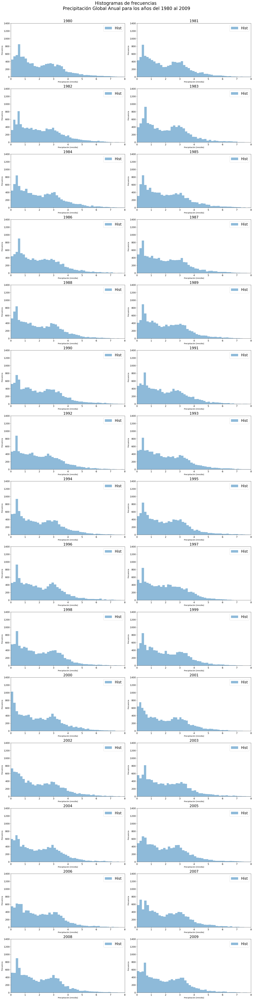

In [59]:
#### Precipitación - Histogramas ANUAL

### Rango de años
añoInicio = 1980
añoFin = 2009

## Preparación para PDF
precip_nobs = []
precip_bins = []

####################################

### Configuraciones para el subplot
filas = 15
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 80))

# Iterar sobre los años y generar los histogramas en los subplots correspondientes
for i, año in enumerate(range(añoInicio, añoFin + 1)):
    # Obtener los datos para el año especificado
    
    #especifico = precipFiltrado.sel(time=datetime(año, 1, 1)).values.flatten()
    especifico = precipFiltrado.sel(time=str(año)).mean(dim='time').values.flatten()
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    # Crear el histograma en el subplot correspondiente
    nobs, bins, patches = axs[fila, columna].hist(especifico, bins = 50 , density=False, alpha=0.5)
    
    #################################
    precip_nobs.append(nobs)
    precip_bins.append(bins)
    #################################
    
    axs[fila, columna].set_title(str(año), fontsize=20)
    
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([0, 8])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 1400])  # Establecer límites del eje y
    
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=13)
    
    # Agregar leyenda al subplot actual
    axs[fila, columna].legend(['Hist'], fontsize=20)

    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Precipitación [mm/día]")  # Nombre del eje x
    axs[fila, columna].set_ylabel("Frecuencia")  # Nombre del eje y

# Estipular el título superior de la figura
fig.suptitle('Histogramas de frecuencias \n Precipitación Global Anual para los años del {} al {} \n \n \n \n \n'.format(añoInicio, añoFin), fontsize=25,va='top')

# Ajustar el espaciado entre los subplots
fig.tight_layout()

# Nombre de archivo para la figura
nombre_figura = "PrecipHistoFrec.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)

# Mostrar la figura
plt.show()

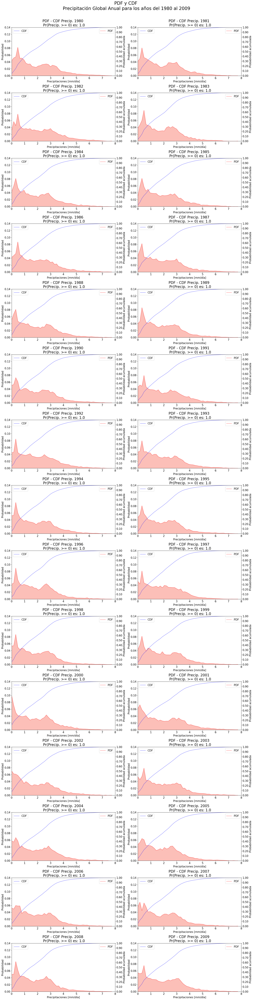

In [12]:
#### Precipitación - PDF y CDF ANUAL

### Rango de años
añoInicio = 1980
añoFin = 2009

## Listas vacías

### Configuraciones para el subplot
filas = 15
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 80))

# Iterar sobre los años y generar los histogramas en los subplots correspondientes
for i, año in enumerate(range(añoInicio, añoFin + 1)):
    # Obtener los datos para el año especificado
    pdf = precip_nobs[i]/sum(precip_nobs[i])
    cdf = np.cumsum(pdf[:])
    
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    
    # Graficar el PDF
    axs[fila, columna].plot(bins[:-1], pdf, "r-", alpha=0.5)
    
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([-0, 8])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 0.14])  # Establecer límites del eje y
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=15)
    # Agregar leyenda al subplot actual
    legend1 = axs[fila, columna].legend(['PDF'], fontsize=15, loc = "upper right")
    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Precipitaciones [mm/día]", fontsize=15)  # Nombre del eje x
    axs[fila, columna].set_ylabel("Probabilidad", fontsize=15)  # Nombre del eje y
    
    # Clonando eje y en la izq  
    axs2 = axs[fila, columna].twinx()
    axs2.plot(bins[:-1], cdf, "b-", alpha=0.5)
    # Estipular tamaño del eje
    axs2.set_ylim([0, 1])
    #
    axs2.set_yticks(np.arange(0, 1.1, 0.1))
    axs2.set_yticklabels([f"{i:.2f}" for i in np.arange(0, 1.1, 0.1)], rotation=0)
    # Estipular nombre del eje
    axs2.set_ylabel("Probabilidad acumulada", fontsize=15)
    axs2.tick_params(axis='y', labelsize=15)
    # Agregar leyenda al subplot actual
    legend2 = axs2.legend(["CDF"], fontsize = 15, loc = "upper left")


    umbralProb = 0
    dondeFill  = tuple([bins[:-1] >= umbralProb])
    probab     = round(np.sum(np.array(pdf)[dondeFill]), 2)
    axs[fila, columna].fill_between(bins[:-1][dondeFill],np.array(pdf)[dondeFill] ,  alpha=0.5,facecolor='salmon', edgecolor='salmon')
        
    # Titulo para cada grafica
    #axs[fila, columna].set_title(str(año), fontsize=20)
    axs[fila, columna].set_title('PDF - CDF Precip. {} \n Pr(Precip. >= {}) es: {}'.format(año, umbralProb, probab), fontsize=20)

# Estipular el título superior de la figura
fig.suptitle('PDF y CDF \n Precipitación Global Anual para los años del {} al {} \n \n \n \n \n'.format(añoInicio, añoFin), fontsize=25,va='top')

# Ajustar el espaciado entre los subplots
fig.tight_layout()

# Nombre de archivo para la figura
nombre_figura = "PrecipPDF_CDF.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)


# Mostrar la figura
plt.show()

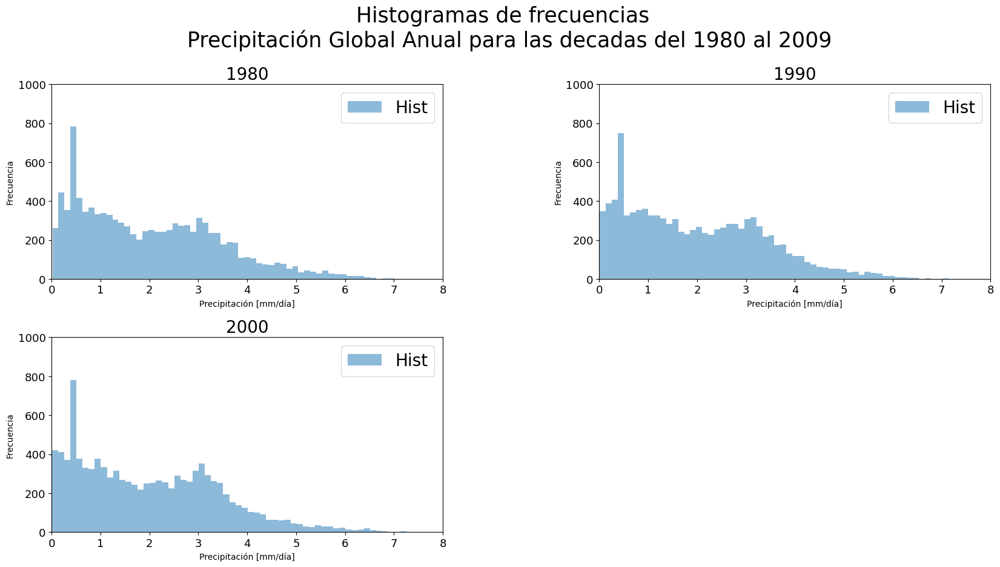

In [82]:
#### Precip - Histogramas DECADA

### Rango de años
años = [1980, 1990, 2000]

## Preparación para PDF
precip_nobs = []
precip_bins = []

####################################

### Configuraciones para el subplot
filas = 2
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 10))

for i in range(len(años)):
    # Obtener los datos para la década especificada
    datos_decada2 = precipFiltrado.sel(time=slice(str(años[i]), str(años[i]+9)))
    
    # Calcular el promedio de la década
    promedio_decada2 = datos_decada2.mean(dim='time').values.flatten()
    
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    # Crear el histograma en el subplot correspondiente
    nobs, bins, patches = axs[fila, columna].hist(promedio_decada2, bins = 60, density=False, alpha=0.5)
    
    #################################
    precip_nobs.append(nobs)
    precip_bins.append(bins)
    #################################
    
    axs[fila, columna].set_title(str(años[i]), fontsize=20)
    
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([0, 8])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 1000])  # Establecer límites del eje y
    
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=13)
    
    # Agregar leyenda al subplot actual
    axs[fila, columna].legend(['Hist'], fontsize=20)

    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Precipitación [mm/día]")  # Nombre del eje x
    axs[fila, columna].set_ylabel("Frecuencia")  # Nombre del eje y

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.3, wspace=0.4, top=0.85)

# Ocultar el subplot de la fila 2 columna 2
axs[1, 1].set_visible(False)

# Estipular el título superior de la figura
fig.suptitle('Histogramas de frecuencias \n Precipitación Global Anual para las decadas del {} al {}'.format(años[0], (años[-1]+9)), fontsize=25,va='top')

# Nombre de archivo para la figura
nombre_figura = "PrecipHistoFrec_DECADA.png"

# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)



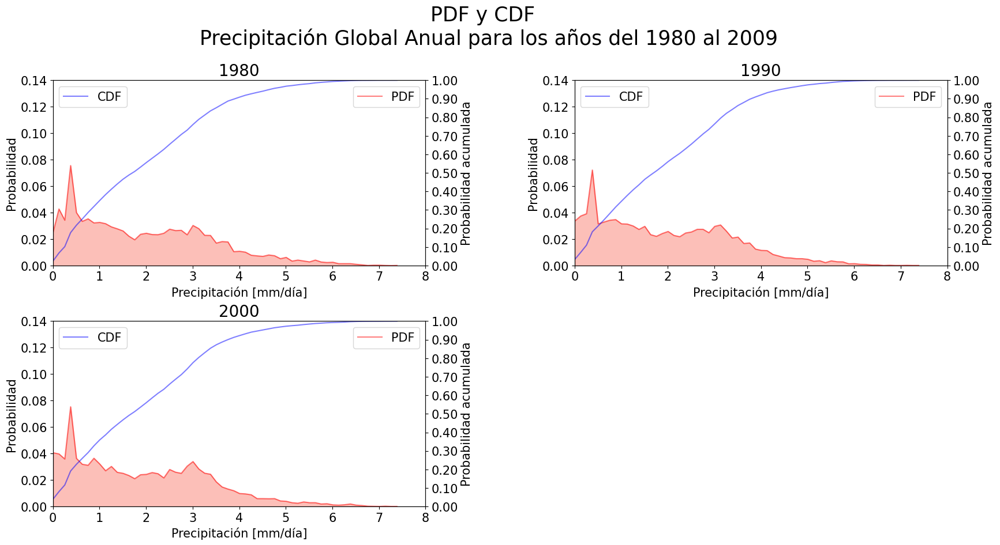

In [83]:
#### TPrecip - Histogramas DECADA

### Rango de años
años = [1980, 1990, 2000]

## Listas vacías

### Configuraciones para el subplot
filas = 2
columnas = 2

### Crear figura de subplots
fig, axs = plt.subplots(filas, columnas, figsize=(20, 10))

for i in range(len(años)):
    # Obtener los datos para la década especificada
    pdf = precip_nobs[i]/sum(precip_nobs[i])
    cdf = np.cumsum(pdf[:])
    
    # Calcular los índices de fila y columna para el subplot actual
    fila = i // columnas
    columna = i % columnas
    
    # Graficar el PDF
    axs[fila, columna].plot(bins[:-1], pdf, "r-", alpha=0.5)
    
    # Titulo para cada grafica
    axs[fila, columna].set_title(str(años[i]), fontsize=20)
    # Estipular tamaños de los ejes
    axs[fila, columna].set_xlim([0, 8])  # Establecer límites del eje x
    axs[fila, columna].set_ylim([0, 0.14])  # Establecer límites del eje y
    # Estipular tamaño de los ticks en los ejes
    axs[fila, columna].tick_params(axis='both', labelsize=15)
    # Agregar leyenda al subplot actual
    legend1 = axs[fila, columna].legend(['PDF'], fontsize=15, loc = "upper right")
    # Estipular nombres de los ejes
    axs[fila, columna].set_xlabel("Precipitación [mm/día]", fontsize=15)  # Nombre del eje x
    axs[fila, columna].set_ylabel("Probabilidad", fontsize=15)  # Nombre del eje y
    
    # Clonando eje y en la izq  
    axs2 = axs[fila, columna].twinx()
    axs2.plot(bins[:-1], cdf, "b-", alpha=0.5)
    # Estipular tamaño del eje
    axs2.set_ylim([0, 1])
    #
    axs2.set_yticks(np.arange(0, 1.1, 0.1))
    axs2.set_yticklabels([f"{i:.2f}" for i in np.arange(0, 1.1, 0.1)], rotation=0)
    # Estipular nombre del eje
    axs2.set_ylabel("Probabilidad acumulada", fontsize=15)
    axs2.tick_params(axis='y', labelsize=15)
    # Agregar leyenda al subplot actual
    legend2 = axs2.legend(["CDF"], fontsize = 15, loc = "upper left")


    umbralProb = 0
    dondeFill  = tuple([bins[:-1] >= umbralProb])
    probab     = round(np.sum(np.array(pdf)[dondeFill]), 2)
    axs[fila, columna].fill_between(bins[:-1][dondeFill],np.array(pdf)[dondeFill] ,  alpha=0.5,facecolor='salmon', edgecolor='salmon')

# Estipular el título superior de la figura
fig.suptitle('PDF y CDF \n Precipitación Global Anual para los años del {} al {}'.format(años[0], (años[-1]+9)), fontsize=25,va='top')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.3, wspace=0.4, top=0.85)

# Ocultar el subplot de la fila 2 columna 2
axs[1, 1].set_visible(False)

# Nombre de archivo para la figura
nombre_figura = "PrecipPDF_CDF_DECADA.png"

# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi=500)

# Mostrar la figura
plt.show()

In [60]:
precipFiltrado["lon"]

<xarray.DataArray 'lon' (lon: 144)>
array([  1.25,   3.75,   6.25,   8.75,  11.25,  13.75,  16.25,  18.75,  21.25,
        23.75,  26.25,  28.75,  31.25,  33.75,  36.25,  38.75,  41.25,  43.75,
        46.25,  48.75,  51.25,  53.75,  56.25,  58.75,  61.25,  63.75,  66.25,
        68.75,  71.25,  73.75,  76.25,  78.75,  81.25,  83.75,  86.25,  88.75,
        91.25,  93.75,  96.25,  98.75, 101.25, 103.75, 106.25, 108.75, 111.25,
       113.75, 116.25, 118.75, 121.25, 123.75, 126.25, 128.75, 131.25, 133.75,
       136.25, 138.75, 141.25, 143.75, 146.25, 148.75, 151.25, 153.75, 156.25,
       158.75, 161.25, 163.75, 166.25, 168.75, 171.25, 173.75, 176.25, 178.75,
       181.25, 183.75, 186.25, 188.75, 191.25, 193.75, 196.25, 198.75, 201.25,
       203.75, 206.25, 208.75, 211.25, 213.75, 216.25, 218.75, 221.25, 223.75,
       226.25, 228.75, 231.25, 233.75, 236.25, 238.75, 241.25, 243.75, 246.25,
       248.75, 251.25, 253.75, 256.25, 258.75, 261.25, 263.75, 266.25, 268.75,
       271.25, 273.75, 276.25, 278.75, 281.25, 283.75, 286.25, 288.75, 291.25,
       293.75, 296.25, 298.75, 301.25, 303.75, 306.25, 308.75, 311.25, 313.75,
       316.25, 318.75, 321.25, 323.75, 326.25, 328.75, 331.25, 333.75, 336.25,
       338.75, 341.25, 343.75, 346.25, 348.75, 351.25, 353.75, 356.25, 358.75],
      dtype=float32)
Coordinates:
  * lon      (lon) float32 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
Attributes:
    units:          degrees_east
    long_name:      Longitude
    actual_range:   [  1.25 358.75]
    standard_name:  longitude
    axis:           X

In [ ]:
###### Mapas interanuales


In [ ]:
##################### temperatura ################################

C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == -179.0 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


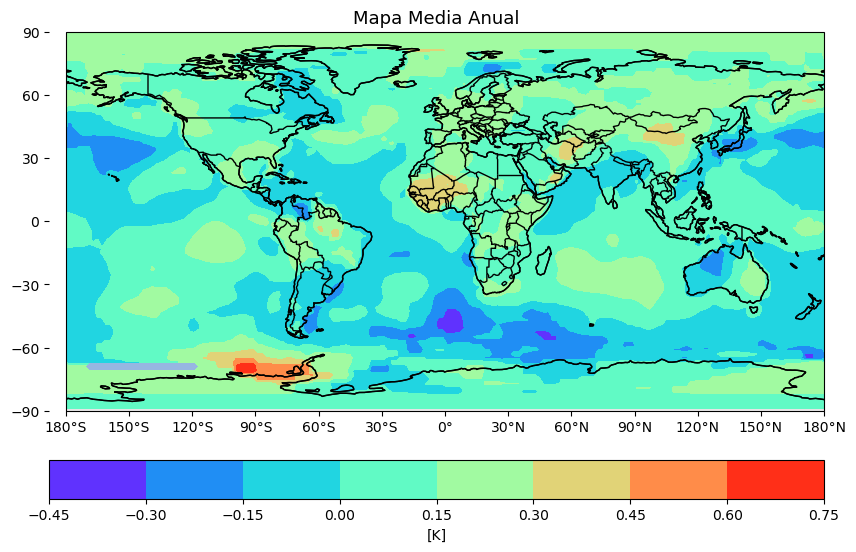

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
Mapa_Media = tempanomalyFiltrado.mean(dim='time')
latx = tempanomalyFiltrado["lat"]
#Mapa_Media = tempXR["tempanomaly"].mean(dim='time')
#latx = tempXR["lat"]

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Media.lon.values
Mapa_Media, lonx = cutil.add_cyclic_point(Mapa_Media, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Media, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[K]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Media Anual', fontsize=13)

# Nombre de archivo para la figura
nombre_figura = "TempMediaAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()

(90, 181)


C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == -179.0 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


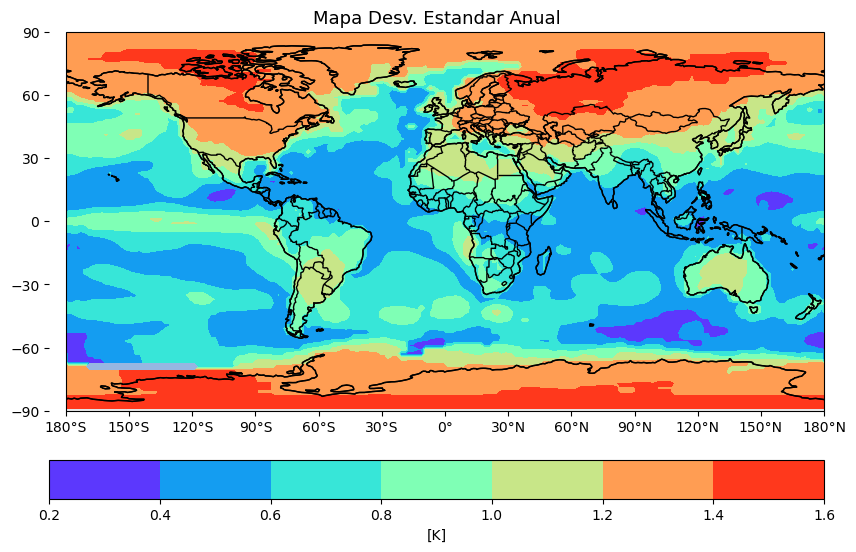

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
Mapa_Desv_Stnd = tempanomalyFiltrado.std(dim='time')
latx = tempanomalyFiltrado["lat"]
#print(Mapa_Desv_Stnd.shape)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Desv_Stnd.lon.values
Mapa_Desv_Stnd, lonx = cutil.add_cyclic_point(Mapa_Desv_Stnd, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:
print(Mapa_Desv_Stnd.shape)#  le adiciona un posición más de latitud al mapa para evitar franja vertical blanca

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Desv_Stnd, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[K]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Desv. Estandar Anual', fontsize=13)

# Nombre de archivo para la figura
nombre_figura = "TempDesvEAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)
plt.show()

C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == -179.0 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


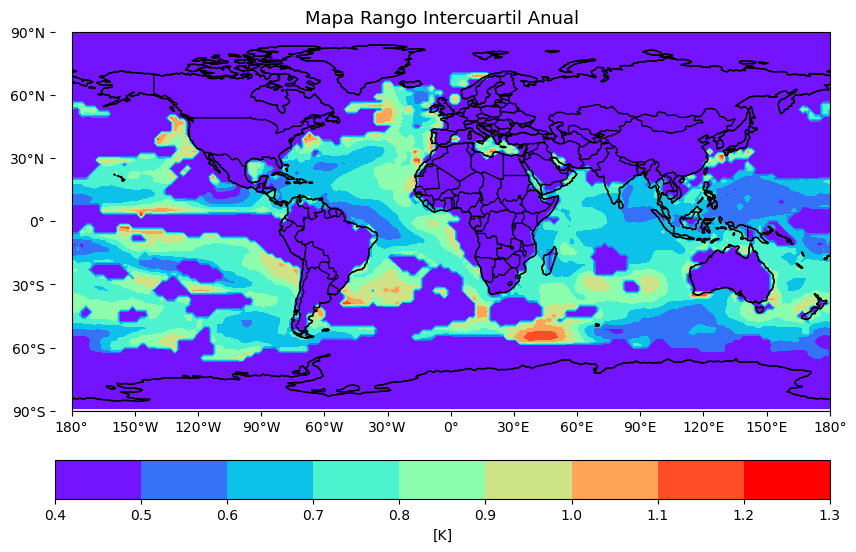

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil
import xarray as xr
import cartopy.mpl.ticker as cticker

plt.close('all')

# Calcular el rango intercuartil anual
#precipFiltrado = ...  # Aquí debes proporcionar tus datos de precipitación filtrados
q1 = np.percentile(tempanomalyFiltrado, 25, axis=0)
q3 = np.percentile(tempanomalyFiltrado, 75, axis=0)
rango_intercuartil = q3 - q1

# Encuentra el valor mínimo de la kurtosis excluyendo NaN
min_rango_intercuartil = np.nanmin(rango_intercuartil)
# Rellena los valores NaN en la kurtosis con el valor mínimo
ex_kurtosis_filled = np.nan_to_num(rango_intercuartil, nan=min_rango_intercuartil)
# Ajusta los límites de la escala de color
vmin = min_rango_intercuartil
vmax = np.nanmax(ex_kurtosis_filled)

# Ajustar los datos para evitar la banda blanca vertical
lonx = tempanomalyFiltrado.lon.values
rango_intercuartil, lonx = cutil.add_cyclic_point(ex_kurtosis_filled , coord=lonx)

# Definir el objeto de Cartopy
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, rango_intercuartil, cmap='rainbow', transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax)
plt.colorbar(cs, location='bottom', pad=0.08, label='[K]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()

plt.title('Mapa Rango Intercuartil Anual', fontsize=13)

# Nombre de archivo para la figura
nombre_figura = "TempIntercuartilAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()

C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == -179.0 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


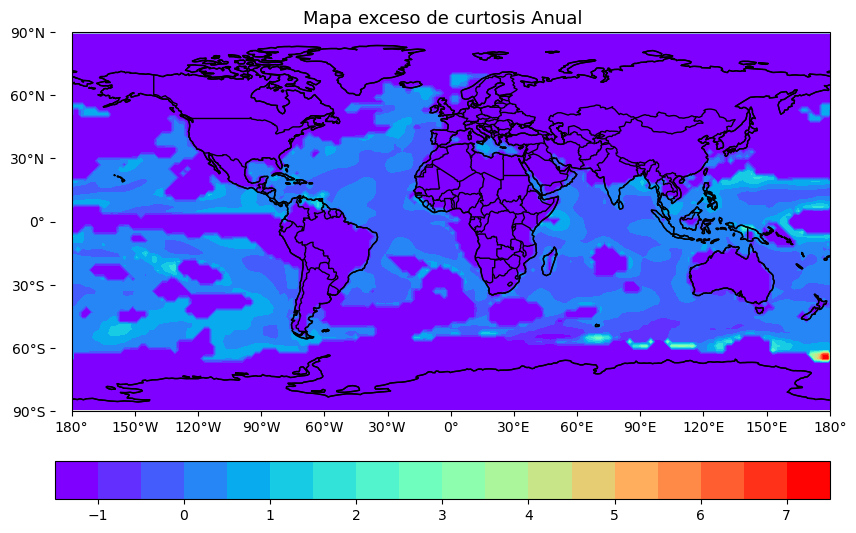

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil
import xarray as xr
import scipy.stats as stats
import cartopy.mpl.ticker as cticker

Mapa_Kurtosis = tempanomalyFiltrado
ex_kurtosis = stats.kurtosis(tempanomalyFiltrado, axis=0, fisher=False) - 3

# Encuentra el valor mínimo de la kurtosis excluyendo NaN
min_kurtosis = np.nanmin(ex_kurtosis)
# Rellena los valores NaN en la kurtosis con el valor mínimo
ex_kurtosis_filled = np.nan_to_num(ex_kurtosis, nan=min_kurtosis)
# Ajusta los límites de la escala de color
vmin = min_kurtosis
vmax = np.nanmax(ex_kurtosis)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Kurtosis.lon.values
ex_kurtosis_filled, lonx = cutil.add_cyclic_point(ex_kurtosis_filled, coord=lonx)

# Definir el objeto de Cartopy
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, ex_kurtosis_filled, cmap='rainbow', transform=ccrs.PlateCarree(), levels=20, vmin=vmin, vmax=vmax)
plt.colorbar(cs, location='bottom', pad=0.08)

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()

plt.title('Mapa exceso de curtosis Anual', fontsize=13)
# Nombre de archivo para la figura
nombre_figura = "TempCurtosisAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()
plt.show()

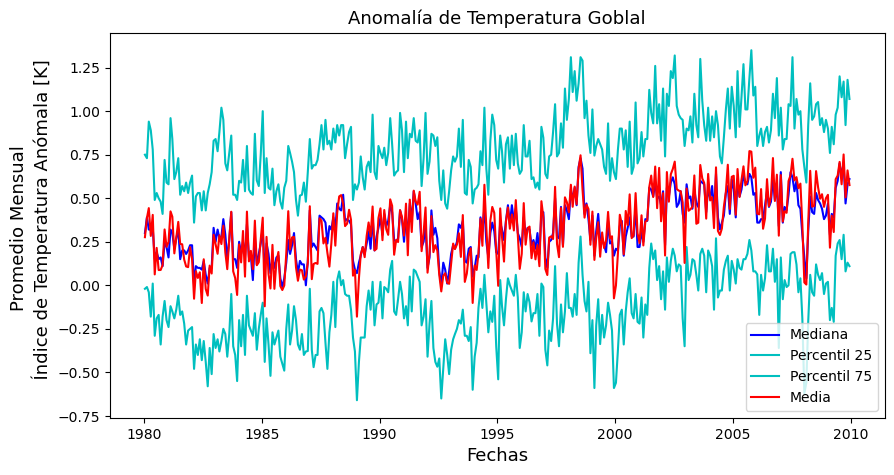

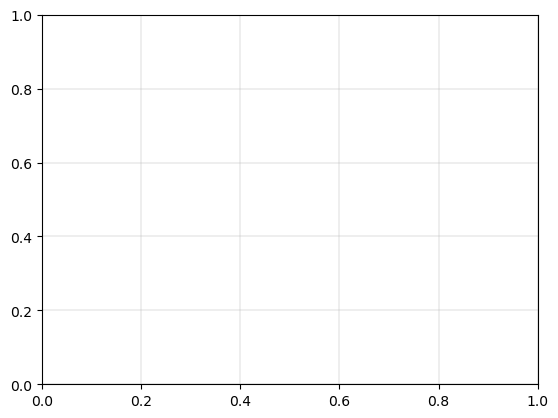

In [19]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

precip_mean   = tempanomalyFiltrado.sel(time=slice('1980', '2009')).mean(dim=['lat', 'lon'])
precip_median = tempanomalyFiltrado.sel(time=slice('1980', '2009')).median(dim=['lat', 'lon'])
precip_p25    = tempanomalyFiltrado.sel(time=slice('1980', '2009')).quantile(0.25, dim=['lat', 'lon'])
precip_p75    = tempanomalyFiltrado.sel(time=slice('1980', '2009')).quantile(0.75, dim=['lat', 'lon'])

# Obtener los valores de tiempo y precipitación como matrices NumPy
time = tempanomalyFiltrado.sel(time=slice('1980', '2009'))["time"].values
precip_mean_values   = precip_mean.values
precip_median_values = precip_median.values
precip_p25_values    = precip_p25.values
precip_p75_values    = precip_p75.values

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, precip_median_values, label='Mediana', c = 'b')
# Graficar la serie de tiempo del percentil 25 de la precipitación
ax.plot(time, precip_p25_values, label='Percentil 25', c = 'c')
# Graficar la serie de tiempo del percentil 75 de la precipitación
ax.plot(time, precip_p75_values, label='Percentil 75', c = 'c')
# Graficar la serie de tiempo de la media espacial de la precipitación
ax.plot(time, precip_mean_values, label='Media', c = 'r')

# Organizar el eje x con los valores deseados
x_ticks = np.arange('1980-01-01', '2011-01-01', dtype='datetime64[Y]').astype('datetime64[ns]')
x_ticks = x_ticks[::5]  # Seleccionar cada quinto elemento para intervalos de 5 años
plt.xticks(x_ticks, ['1980', '1985', '1990', '1995', '2000', '2005', '2010'])


# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Fechas',fontsize=13)
ax.set_ylabel("Promedio Mensual \n  Índice de Temperatura Anómala [K]", fontsize=13)
ax.set_title(u'Anomalía de Temperatura Goblal',fontsize=13)
ax.legend()

# Nombre de archivo para la figura
nombre_figura = "TempRelacionAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()

plt.grid(lw=0.3)

# Mostrar la figura
plt.show()

In [ ]:
################Precipitación###############################

C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


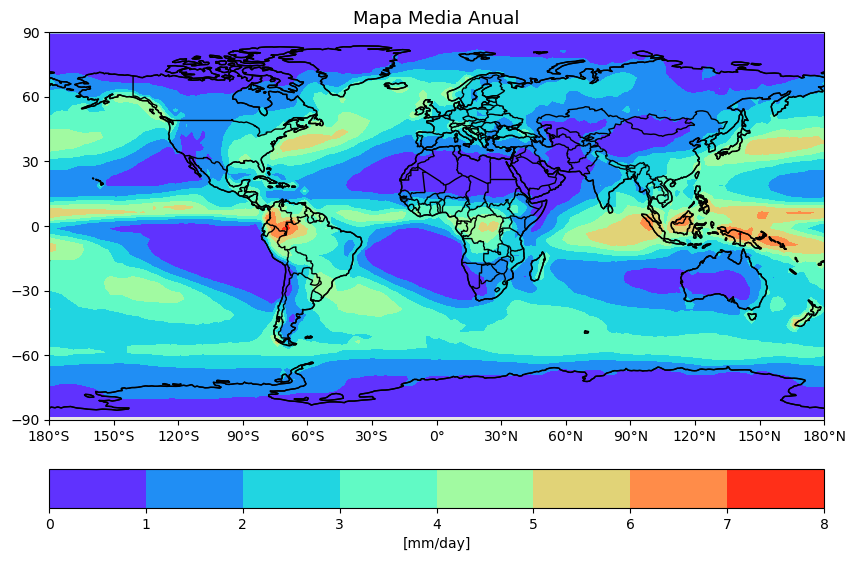

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
Mapa_Media = precipFiltrado.mean(dim='time')
latx = precipFiltrado["lat"]

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Media.lon.values
Mapa_Media, lonx = cutil.add_cyclic_point(Mapa_Media, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Media, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[mm/day]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Media Anual', fontsize=13)

# Nombre de archivo para la figura
nombre_figura = "PrecipMediaAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()
plt.show()

(72, 145)


C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


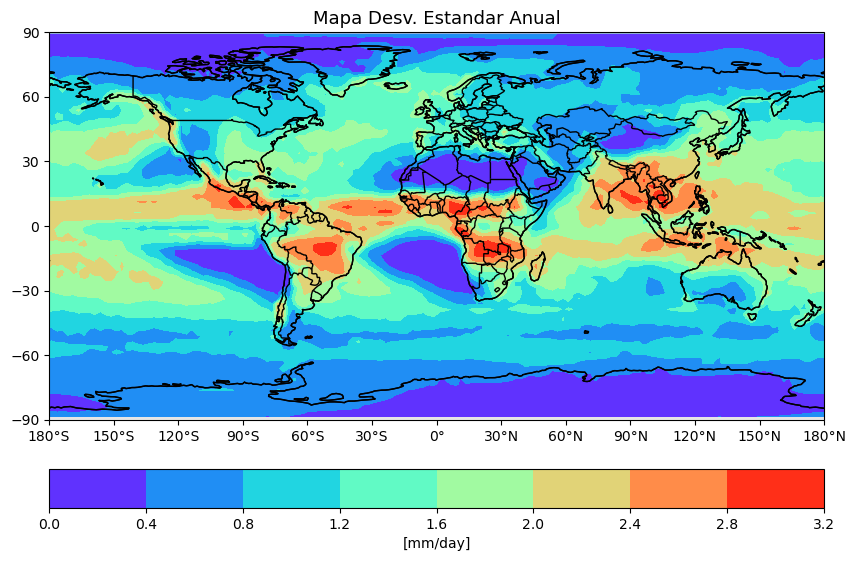

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
Mapa_Desv_Stnd = precipFiltrado.std(dim='time')
latx = precipFiltrado["lat"]
#print(Mapa_Desv_Stnd.shape)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Desv_Stnd.lon.values
Mapa_Desv_Stnd, lonx = cutil.add_cyclic_point(Mapa_Desv_Stnd, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:
print(Mapa_Desv_Stnd.shape)#  le adiciona un posición más de latitud al mapa para evitar franja vertical blanca

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Desv_Stnd, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[mm/day]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Desv. Estandar Anual', fontsize=13)

# Nombre de archivo para la figura
nombre_figura = "PrecipDesvEAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()
plt.show()

C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


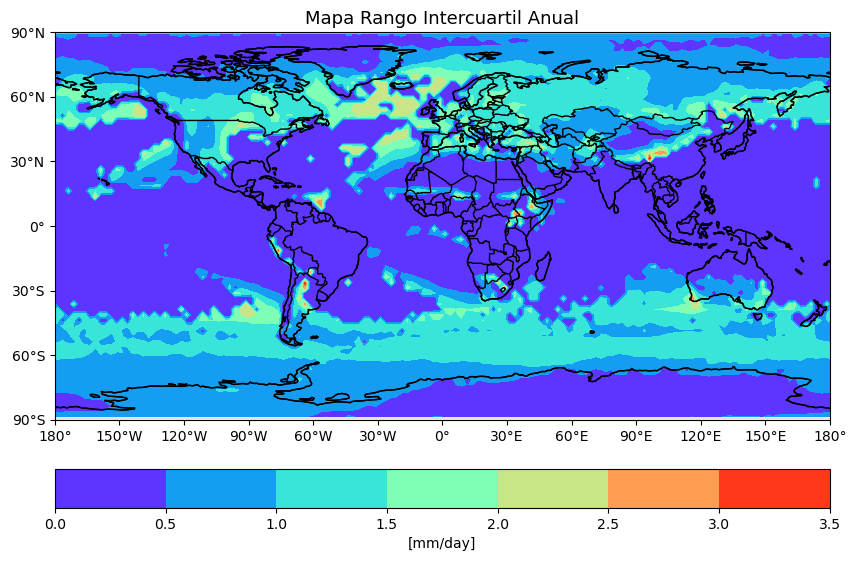

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil
import xarray as xr
import cartopy.mpl.ticker as cticker

plt.close('all')

# Calcular el rango intercuartil anual
#precipFiltrado = ...  # Aquí debes proporcionar tus datos de precipitación filtrados
q1 = np.percentile(precipFiltrado, 25, axis=0)
q3 = np.percentile(precipFiltrado, 75, axis=0)
rango_intercuartil = q3 - q1

# Encuentra el valor mínimo de la kurtosis excluyendo NaN
min_rango_intercuartil = np.nanmin(rango_intercuartil)
# Rellena los valores NaN en la kurtosis con el valor mínimo
ex_kurtosis_filled = np.nan_to_num(rango_intercuartil, nan=min_rango_intercuartil)
# Ajusta los límites de la escala de color
vmin = min_rango_intercuartil
vmax = np.nanmax(ex_kurtosis_filled)

# Ajustar los datos para evitar la banda blanca vertical
lonx = precipFiltrado.lon.values
rango_intercuartil, lonx = cutil.add_cyclic_point(ex_kurtosis_filled , coord=lonx)

# Definir el objeto de Cartopy
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, rango_intercuartil, cmap='rainbow', transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax)
plt.colorbar(cs, location='bottom', pad=0.08, label='[mm/day]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()

plt.title('Mapa Rango Intercuartil Anual', fontsize=13)
# Nombre de archivo para la figura
nombre_figura = "PrecipIntercuartilAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()
plt.show()

C:\Users\moise\anaconda3\lib\site-packages\cartopy\mpl\geoaxes.py:873: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


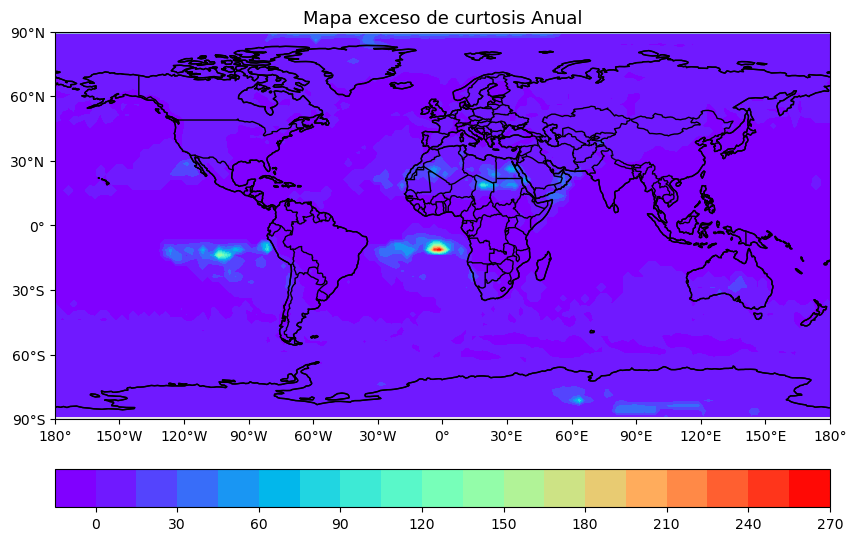

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil
import xarray as xr
import scipy.stats as stats
import cartopy.mpl.ticker as cticker

Mapa_Kurtosis = precipFiltrado
ex_kurtosis = stats.kurtosis(precipFiltrado, axis=0, fisher=False) - 3

# Encuentra el valor mínimo de la kurtosis excluyendo NaN
min_kurtosis = np.nanmin(ex_kurtosis)
# Rellena los valores NaN en la kurtosis con el valor mínimo
ex_kurtosis_filled = np.nan_to_num(ex_kurtosis, nan=min_kurtosis)
# Ajusta los límites de la escala de color
vmin = min_kurtosis
vmax = np.nanmax(ex_kurtosis)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Kurtosis.lon.values
ex_kurtosis_filled, lonx = cutil.add_cyclic_point(ex_kurtosis_filled, coord=lonx)

# Definir el objeto de Cartopy
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, ex_kurtosis_filled, cmap='rainbow', transform=ccrs.PlateCarree(), levels=20, vmin=vmin, vmax=vmax)
plt.colorbar(cs, location='bottom', pad=0.08)

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()

plt.title('Mapa exceso de curtosis Anual', fontsize=13)
# Nombre de archivo para la figura
nombre_figura = "PrecipCurtosisAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()
plt.show()

In [ ]:
### NO ES --- ES DEL GENERAL

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

ds = xr.open_dataset(ruta + precip)


precip_mean   = ds['precip'].mean(dim=['lat', 'lon'])
precip_median = ds['precip'].median(dim=['lat', 'lon'])
precip_p25    = ds['precip'].quantile(0.25, dim=['lat', 'lon'])
precip_p75    = ds['precip'].quantile(0.75, dim=['lat', 'lon'])

# Obtener los valores de tiempo y precipitación como matrices NumPy
time = precip_mean['time'].values
precip_mean_values   = precip_mean.values
precip_median_values = precip_median.values
precip_p25_values    = precip_p25.values
precip_p75_values    = precip_p75.values

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, precip_median_values, label='Median', c = 'b')
# Graficar la serie de tiempo del percentil 25 de la precipitación
ax.plot(time, precip_p25_values, label='Percentile 25', c = 'c')
# Graficar la serie de tiempo del percentil 75 de la precipitación
ax.plot(time, precip_p75_values, label='Percentile 75', c = 'c')
# Graficar la serie de tiempo de la media espacial de la precipitación
ax.plot(time, precip_mean_values, label='Mean', c = 'r')

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Fechas',fontsize=13)
ax.set_ylabel("Promedio Mensual \n Índice de precipitaciones [mm/day]", fontsize=13)
ax.set_title(u'Precipitación Global',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Mostrar la figura
plt.show()

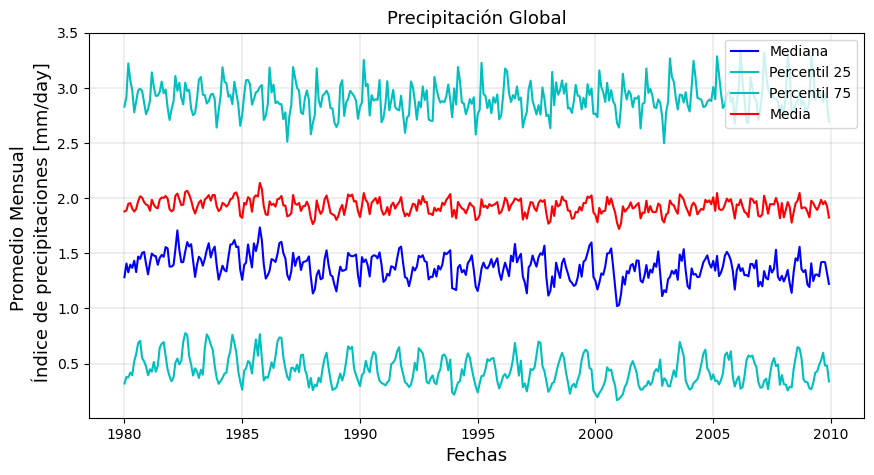

In [24]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

precip_mean   = precipFiltrado.sel(time=slice('1980', '2009')).mean(dim=['lat', 'lon'])
precip_median = precipFiltrado.sel(time=slice('1980', '2009')).median(dim=['lat', 'lon'])
precip_p25    = precipFiltrado.sel(time=slice('1980', '2009')).quantile(0.25, dim=['lat', 'lon'])
precip_p75    = precipFiltrado.sel(time=slice('1980', '2009')).quantile(0.75, dim=['lat', 'lon'])

# Obtener los valores de tiempo y precipitación como matrices NumPy
time = precipFiltrado.sel(time=slice('1980', '2009'))["time"].values
precip_mean_values   = precip_mean.values
precip_median_values = precip_median.values
precip_p25_values    = precip_p25.values
precip_p75_values    = precip_p75.values

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, precip_median_values, label='Mediana', c = 'b')
# Graficar la serie de tiempo del percentil 25 de la precipitación
ax.plot(time, precip_p25_values, label='Percentil 25', c = 'c')
# Graficar la serie de tiempo del percentil 75 de la precipitación
ax.plot(time, precip_p75_values, label='Percentil 75', c = 'c')
# Graficar la serie de tiempo de la media espacial de la precipitación
ax.plot(time, precip_mean_values, label='Media', c = 'r')

# Organizar el eje x con los valores deseados
x_ticks = np.arange('1980-01-01', '2011-01-01', dtype='datetime64[Y]').astype('datetime64[ns]')
x_ticks = x_ticks[::5]  # Seleccionar cada quinto elemento para intervalos de 5 años
plt.xticks(x_ticks, ['1980', '1985', '1990', '1995', '2000', '2005', '2010'])
# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Fechas',fontsize=13)
ax.set_ylabel("Promedio Mensual \n Índice de precipitaciones [mm/day]", fontsize=13)
ax.set_title(u'Precipitación Global',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Nombre de archivo para la figura
nombre_figura = "PrecipRelacionAnual.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()

# Mostrar la figura
plt.show()

In [ ]:
###########PUNTO 4###############

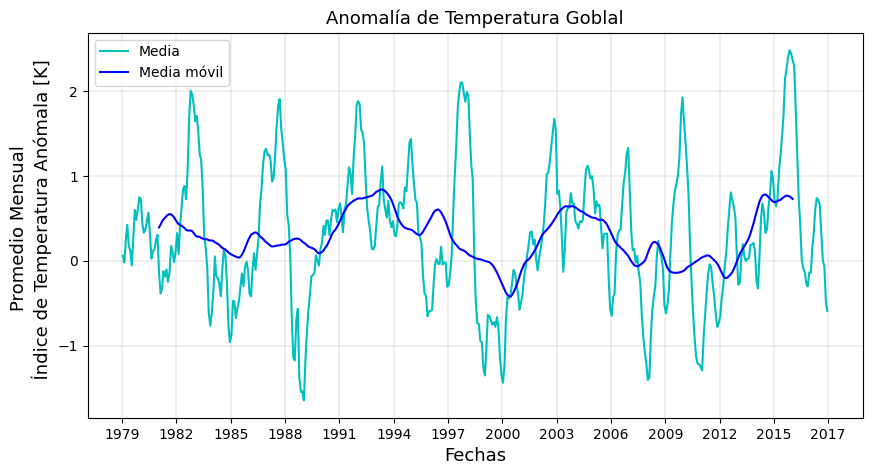

In [7]:
################# Temperatura ##################
# Filtrar los datos de precipitación entre las latitudes -5 y 5
tempanomalyFiltrado34 = tempanomalyFiltrado.sel(lat=slice(-5, 5)).sel(lon=slice(-170, -120))

# Imprimir el resultado del filtrado
#print(tempanomalyFiltrado34)

tempMedia = tempanomalyFiltrado34.sel(time=slice('1979', '2017')).mean(dim=['lat', 'lon'])
tempMediaValores = tempMedia.values

# Calcula la media móvil
ventana = 48  # Tamaño de la ventana de la media móvil
precipMediaMovil = np.convolve(tempMediaValores, np.ones(ventana)/ventana, mode = "valid")

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])

### precipFiltrado["time"]
time = tempanomalyFiltrado34.sel(time=slice('1979', '2017'))["time"].values
timeMovil = tempanomalyFiltrado34.sel(time=slice('1981-01', '2016-1'))["time"].values
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, tempMediaValores, label='Media', c = 'c')
# Graficar la serie de tiempo del percentil 25 de la precipitación
ax.plot(timeMovil, precipMediaMovil, label='Media móvil', c = 'b')


# Organizar el eje x con los valores deseados
x_ticks = np.arange('1979-01-01', '2019-01-01', dtype='datetime64[Y]').astype('datetime64[ns]')
x_ticks = x_ticks[::3]  # Seleccionar cada quinto elemento para intervalos de 5 años
plt.xticks(x_ticks, ['1979', '1982', '1985', '1988', '1991', '1994', '1997','2000','2003', '2006','2009', '2012','2015','2017',])

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Fechas',fontsize=13)
ax.set_ylabel("Promedio Mensual \n  Índice de Temperatura Anómala [K]", fontsize=13)
ax.set_title(u'Anomalía de Temperatura Goblal',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Nombre de archivo para la figura
#nombre_figura = "TempMediaMovil.png"
# Guardar el plot en la ruta especificada
#plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

#plt.show()

# Mostrar la gráfica
#plt.show()

In [11]:
print(tempanomalyFiltrado.sel(time=slice('1979', '2017')).mean(dim=['lat', 'lon']))

<xarray.DataArray 'tempanomaly' (time: 468)>
array([ 1.54721037e-01,  5.48434742e-02,  2.06827432e-01,  1.75450087e-01,
        5.26753031e-02,  5.63294664e-02,  7.70621970e-02, -4.15956527e-02,
        2.23718464e-01,  6.17500469e-02,  2.40772828e-01,  2.82225341e-01,
        2.76289731e-01,  3.86441141e-01,  4.43166316e-01,  2.83545792e-01,
        4.04445797e-01,  6.25582561e-02,  2.14927688e-01,  8.75553489e-02,
        8.80566835e-02,  1.16421707e-01,  3.20756733e-01,  2.20735192e-01,
        2.48688117e-01,  4.24495429e-01,  3.93710315e-01,  1.83262706e-01,
        2.71358311e-01,  3.64179820e-01,  2.37647414e-01,  2.35521466e-01,
        1.47664413e-01,  1.08345747e-01,  1.04170725e-01,  2.18133718e-01,
        1.50920495e-01, -7.71620050e-02,  8.13747272e-02,  4.21923846e-02,
        7.46565014e-02, -1.01746559e-01,  1.49443254e-01, -2.12034862e-02,
       -5.91010004e-02,  1.13065675e-01,  6.77477345e-02,  2.89989322e-01,
        2.34635264e-01,  1.81102946e-01,  2.87317753e-0

In [13]:
print(tempMedia.shape)

(468,)


In [ ]:
print(tempanomalyFiltrado34 )

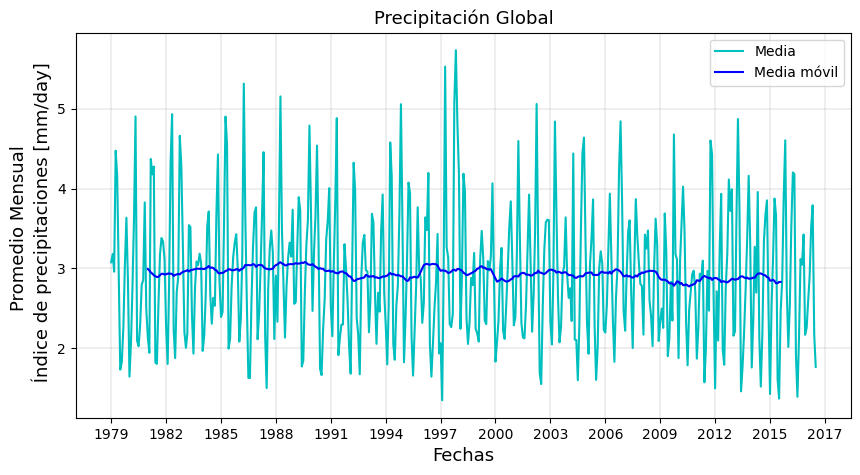

In [26]:
################# Precipitación ##################
# Filtrar los datos de precipitación entre las latitudes -5 y 5
precipFiltrado34 = precipFiltrado.sel(lat=slice(-5, 5)).sel(lon=slice(10, 60))

# Imprimir el resultado del filtrado
#print(precipFiltrado34)

precipMedia = precipFiltrado34.sel(time=slice('1979', '2017')).mean(dim=['lat', 'lon'])
precipMediaValores = precipMedia.values

# Calcula la media móvil
ventana = 48  # Tamaño de la ventana de la media móvil
precipMediaMovil = np.convolve(precipMediaValores, np.ones(ventana)/ventana, mode = "valid")

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])

### precipFiltrado["time"]
time = precipFiltrado34.sel(time=slice('1979', '2017'))["time"].values
timeMovil = precipFiltrado34.sel(time=slice('1981-01', '2015-08'))["time"].values
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, precipMediaValores, label='Media', c = 'c')
# Graficar la serie de tiempo del percentil 25 de la precipitación
ax.plot(timeMovil, precipMediaMovil, label='Media móvil', c = 'b')


# Organizar el eje x con los valores deseados
x_ticks = np.arange('1979-01-15', '2019-01-15', dtype='datetime64[Y]').astype('datetime64[ns]')
x_ticks = x_ticks[::3]  # Seleccionar cada quinto elemento para intervalos de 5 años
plt.xticks(x_ticks, ['1979', '1982', '1985', '1988', '1991', '1994', '1997','2000','2003', '2006','2009', '2012','2015','2017',])

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Fechas',fontsize=13)
ax.set_ylabel("Promedio Mensual \n Índice de precipitaciones [mm/day]", fontsize=13)
ax.set_title(u'Precipitación Global',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Nombre de archivo para la figura
nombre_figura = "PrecipMediaMovil.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()

# Mostrar la gráfica
plt.show()

In [ ]:
################ Punto 5 

In [ ]:
################# Temperatura ###############

In [ ]:
tempFiltrado = tempanomalyFiltrado.sel(time=slice('1979', '2017'))
lat = tempFiltrado["lat"]
lon = tempFiltrado["lon"]

Mapa_Correlacion2 = np.zeros([len(lat),len(lon)]) * np.NaN
for i in range(len(lat)):
    for j in range(len(lon)):
        Mapa_Correlacion2[i,j] = scp.spearmanr(tempMediaValores,tempFiltrado[:,i,j],nan_policy = 'omit')[0]

In [ ]:
# Ajustar los datos para evitar la banda blanca vertical
lat = tempFiltrado["lat"]
lon = tempFiltrado["lon"]
Mapa, lon = cutil.add_cyclic_point(Mapa_Correlacion2, coord=lon)

# Definir el objeto de Cartopy
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))  # Ajustar el central_longitude a 180
ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41))
cbar = plt.colorbar(cs, location='bottom', pad=0.08)
cbar.set_ticks(np.linspace(-1, 1, 11))

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(0, 361, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()

plt.title('Correlación entre STA en Niño 3-4 y STA Planetario', fontsize=13)
plt.show()

In [ ]:
tempFiltrado = tempanomalyFiltrado.sel(time=slice('1979', '2017'))
lat = tempFiltrado["lat"]
lon = tempFiltrado["lon"]

Matriz_Meses_Corr2 = np.zeros([12,len(lat),len(lon)]) * np.NaN 

for k in range(1, 13):
    #print(k)
    Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k))
    #print(len(Temp_meses))
    TempNino_meses = tempMedia.sel(time=(tempMedia.time.dt.month == k)).values
    if len(Temp_meses) >= 3:
        for i in range(len(lat)):
            for j in range(len(lon)):
                if np.sum(~np.isnan(Temp_meses[:, i, j])) >= 3:
                    Matriz_Meses_Corr2[k - 1, i, j] = scp.spearmanr(Temp_meses[:, i, j], TempNino_meses, nan_policy='omit')[0]

In [ ]:
print(lat)

In [ ]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']


vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(4, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 3-4 y STA Planetario', fontsize=20, y=0.92)

# Iterar sobre los meses y los subplots
for i, mes in enumerate(meses):
    lat = tempFiltrado["lat"]
    lon = tempFiltrado["lon"]
    # Obtener los datos para el mes actual
    Mapa, lon = cutil.add_cyclic_point(Matriz_Meses_Corr2[i, :, :], coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(-180, 181, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Correlación {}".format(mes), fontsize=15)

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico
plt.show()

In [ ]:
import numpy as np
import scipy.stats as scp

lat = tempFiltrado["lat"]
lon = tempFiltrado["lon"]

Corr_R2 = np.zeros([12, 13, len(lat), len(lon)]) * np.NaN

for k in range(1, 13):
    print("\n", k)
    TempNino_meses = tempMedia.sel(time=(tempMedia.time.dt.month == k) & (tempMedia.time.dt.year <= 2016)).values
    TempNino = TempNino_meses[:-1]
    for Rezago in range(0, 13):
        if 12 - k >= Rezago:
            print(Rezago, k - Rezago)
            Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k + Rezago) & (tempFiltrado.time.dt.year <= 2015))
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R2[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R2[k - 1, Rezago, i, j] = np.NaN
        else:
            print(Rezago, k - Rezago)
            Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k + (Rezago - 12)) & (tempFiltrado.time.dt.year <= 2016))[1:]
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R2[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R2[k - 1, Rezago, i, j] = np.NaN


In [ ]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 3
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 3-4 y STA Planetario \n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = tempFiltrado["lat"]
    lon = tempFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R2[mes-1,i,:,:], coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico
plt.show()


In [ ]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 12
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 3-4 y STA Planetario \n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = tempFiltrado["lat"]
    lon = tempFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R2[mes-1,i,:,:], coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico
plt.show()


In [ ]:
################# Precipitación ###############

In [ ]:
lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]

Mapa_Correlacion = np.zeros([len(lat),len(lon)]) * np.NaN
for i in range(len(lat)):
    for j in range(len(lon)):
        Mapa_Correlacion[i,j] = scp.spearmanr(precipMediaValores,precipFiltrado[:,i,j],nan_policy = 'omit')[0]

In [ ]:
#Mapa de correlación usando BaseMap

#plt.close('all')
#fig = plt.figure(figsize=(10,8))
#ax = fig.add_subplot(111)
#vmin = -1
#vmax = 1
#m = Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat),llcrnrlon=np.min(0),urcrnrlon=np.max(360),\
#rsphere=6371200.,resolution='l',area_thresh=10000)

#ny = lat.shape[0]; nx = lon.shape[0]
#lons, lats = m.makegrid(nx, ny)
#x,y = m(lons, lats)
#cs = m.contourf(x,y,np.flipud(Mapa))

#cs = m.contourf(x,y,np.roll(Mapa_Correlacion, int(len(lon)/2)),cmap='RdBu_r',levels = 40)

#plt.clim(-1, 1)  # Establecer los límites de la barra de colores
#m.colorbar(cs,label = 'Coeficiente de correlación de Spearman')
#m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=11,linewidth=0.1)
#m.drawmeridians(np.arange(0, 360, 30.), labels=[0,1,0,1], size=11, linewidth=0.1)# por estas longitudes (meridianos) 0 a 360 es que se aplica roll a la matriz bidimensional Mapa_Correlacion
#m.drawcoastlines()
#m.drawmapboundary()
#plt.title('Correlación entre PPT en Niño 3-4 y PPT Planetario', fontsize=13)

In [ ]:
# Ajustar los datos para evitar la banda blanca vertical
lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]
Mapa, lon = cutil.add_cyclic_point(np.roll(Mapa_Correlacion, int(len(lon) / 2)), coord=lon)

# Definir el objeto de Cartopy
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))  # Ajustar el central_longitude a 180
ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lon, latx, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41))
cbar = plt.colorbar(cs, location='bottom', pad=0.08)
cbar.set_ticks(np.linspace(-1, 1, 11))

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(0, 361, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()

plt.title('Correlación entre PPT en Niño 3-4 y PPT Planetario', fontsize=13)
plt.show()

In [ ]:
lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]

Matriz_Meses_Corr = np.zeros([12,len(lat),len(lon)]) * np.NaN 

for k in range(1, 13):
    #print(k)
    Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k))
    #print(len(Temp_meses))
    TempNino_meses = precipMedia.sel(time=(precipMedia.time.dt.month == k)).values
    #print(len(TempNino_meses), "\n")
    #print(len(Temp_meses), len(TempNino_meses), "\n")
    #for i in range(len(lat)):
     #   for j in range(len(lon)):
      #       Matriz_Meses_Corr[k - 1, i, j] = scp.spearmanr(Temp_meses[:, i, j], TempNino_meses, nan_policy='omit')[0]
    if len(Temp_meses) >= 3:
        for i in range(len(lat)):
            for j in range(len(lon)):
                if np.sum(~np.isnan(Temp_meses[:, i, j])) >= 3:
                    Matriz_Meses_Corr[k - 1, i, j] = scp.spearmanr(Temp_meses[:, i, j], TempNino_meses, nan_policy='omit')[0]

In [ ]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(4, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre PPT en Niño 3-4 y PPT Planetario', fontsize=20, y=0.92)

# Iterar sobre los meses y los subplots
for i, mes in enumerate(meses):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(np.roll(Matriz_Meses_Corr[i, :, :], int(len(lon) / 2)), coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Correlación {}".format(mes), fontsize=15)

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico
plt.show()


In [ ]:
import numpy as np
import scipy.stats as scp

lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]

Corr_R = np.zeros([12, 13, len(lat), len(lon)]) * np.NaN

for k in range(1, 13):
    print("\n", k)
    TempNino_meses = precipMedia.sel(time=(precipMedia.time.dt.month == k) & (precipFiltrado.time.dt.year <= 2016)).values
    TempNino = TempNino_meses[:-1]
    for Rezago in range(0, 13):
        if 12 - k >= Rezago:
            print(Rezago, k - Rezago)
            Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k + Rezago) & (precipFiltrado.time.dt.year <= 2015))
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R[k - 1, Rezago, i, j] = np.NaN
        else:
            print(Rezago, k - Rezago)
            Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k + (Rezago - 12)) & (precipFiltrado.time.dt.year <= 2016))[1:]
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R[k - 1, Rezago, i, j] = np.NaN


In [ ]:
import numpy as np
import scipy.stats as scp

lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]

Corr_R = np.zeros([12, 13, len(lat), len(lon)]) * np.NaN

for k in range(1, 13):
    print("\n", k)
    TempNino_meses = precipMedia.sel(time=(precipMedia.time.dt.month == k) & (precipMedia.time.dt.year <= 2016)).values
    TempNino = TempNino_meses[:-1]
    for Rezago in range(0, 13):
        if 12 - k >= Rezago:
            print(Rezago, k - Rezago)
            Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k + Rezago) & (precipFiltrado.time.dt.year <= 2015))
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R[k - 1, Rezago, i, j] = np.NaN
        else:
            print(Rezago, k - Rezago)
            Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k + (Rezago - 12)) & (precipFiltrado.time.dt.year <= 2016))[1:]
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R[k - 1, Rezago, i, j] = np.NaN


In [ ]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 3
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre PPT en Niño 3-4 y PPT Planetario para \n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(np.roll(Corr_R[mes-1,i,:,:], int(len(lon) / 2)), coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico
plt.show()


In [ ]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 12
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre PPT en Niño 3-4 y PPT Planetario para \n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(np.roll(Corr_R[mes-1,i,:,:], int(len(lon) / 2)), coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico
plt.show()

In [ ]:
################### niño34 STA rezagado con PPT planetaria

In [30]:
import numpy as np
import scipy.stats as scp

tempFiltrado = tempanomalyFiltrado.sel(time=slice('1979', '2017'))

lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]

Corr_R3 = np.zeros([12, 13, len(lat), len(lon)]) * np.NaN

for k in range(1, 13):
    print("\n", k)
    TempNino_meses = tempMedia.sel(time=(tempMedia.time.dt.month == k) & (tempMedia.time.dt.year <= 2016)).values
    TempNino = TempNino_meses[:-1]
    for Rezago in range(0, 13):
        if 12 - k >= Rezago:
            print(Rezago, k - Rezago)
            #Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k + Rezago) & (tempFiltrado.time.dt.year <= 2015))
            Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k + Rezago) & (precipFiltrado.time.dt.year <= 2015))
            Temp_meses = np.roll(Temp_meses, int(len(lon) / 2))
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R3[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R3[k - 1, Rezago, i, j] = 0
        else:
            print(Rezago, k - Rezago)
            Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k + (Rezago - 12)) & (tempFiltrado.time.dt.year <= 2016))[1:]
            Temp_meses = np.roll(Temp_meses, int(len(lon) / 2))
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R3[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R3[k - 1, Rezago, i, j] = 0


 1
0 1
37
37
1 0
37
37
2 -1
37
37
3 -2
37
37
4 -3
37
37
5 -4
37
37
6 -5
37
37
7 -6
37
37
8 -7
37
37
9 -8
37
37
10 -9
37
37
11 -10
37
37
12 -11
37
37

 2
0 2
37
37
1 1
37
37
2 0
37
37
3 -1
37
37
4 -2
37
37
5 -3
37
37
6 -4
37
37
7 -5
37
37
8 -6
37
37
9 -7
37
37
10 -8
37
37
11 -9
37
37
12 -10
37
37

 3
0 3
37
37
1 2
37
37
2 1
37
37
3 0
37
37
4 -1
37
37
5 -2
37
37
6 -3
37
37
7 -4
37
37
8 -5
37
37
9 -6
37
37
10 -7
37
37
11 -8
37
37
12 -9
37
37

 4
0 4
37
37
1 3
37
37
2 2
37
37
3 1
37
37
4 0
37
37
5 -1
37
37
6 -2
37
37
7 -3
37
37
8 -4
37
37
9 -5
37
37
10 -6
37
37
11 -7
37
37
12 -8
37
37

 5
0 5
37
37
1 4
37
37
2 3
37
37
3 2
37
37
4 1
37
37
5 0
37
37
6 -1
37
37
7 -2
37
37
8 -3
37
37
9 -4
37
37
10 -5
37
37
11 -6
37
37
12 -7
37
37

 6
0 6
37
37
1 5
37
37
2 4
37
37
3 3
37
37
4 2
37
37
5 1
37
37
6 0
37
37
7 -1
37
37
8 -2
37
37
9 -3
37
37
10 -4
37
37
11 -5
37
37
12 -6
37
37

 7
0 7
37
37
1 6
37
37
2 5
37
37
3 4
37
37
4 3
37
37
5 2
37
37
6 1
37
37
7 0
37
37
8 -1
37
37
9 -2
37
37
10 -3
37
37
11 -4


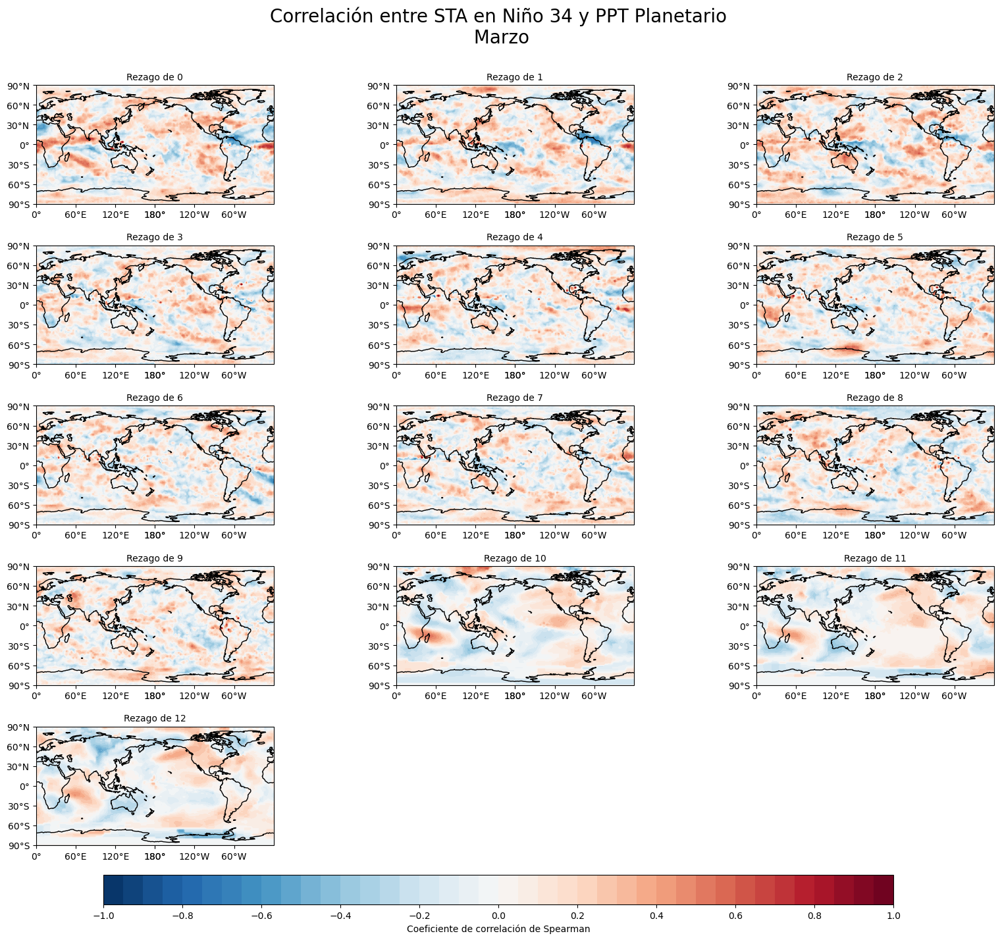

In [57]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 3
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 34 y PPT Planetario\n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R3[mes-1,i,:,:], coord=lon)

    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(-180, 181, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Nombre de archivo para la figura
nombre_figura = "M1niñoPPTplanetaMarzo.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

plt.show()

# Mostrar el gráfico
plt.show()

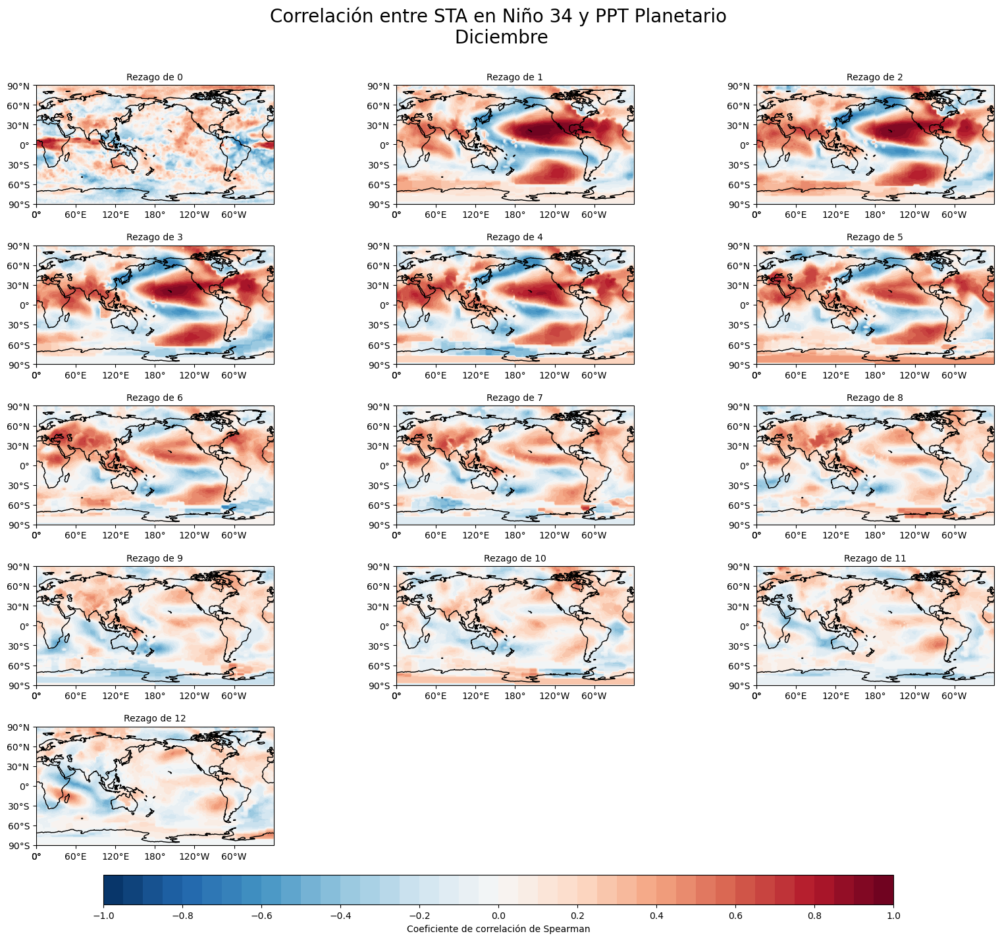

In [58]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 12
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 34 y PPT Planetario\n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R3[mes-1,i,:,:], coord=lon)
    #np.roll(Corr_R3[mes-1,i,:,:], int(len(lon) / 2))
    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Nombre de archivo para la figura
nombre_figura = "M1STAniñoPPTplanetaDiciembre.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)

# Mostrar el gráfico
plt.show()

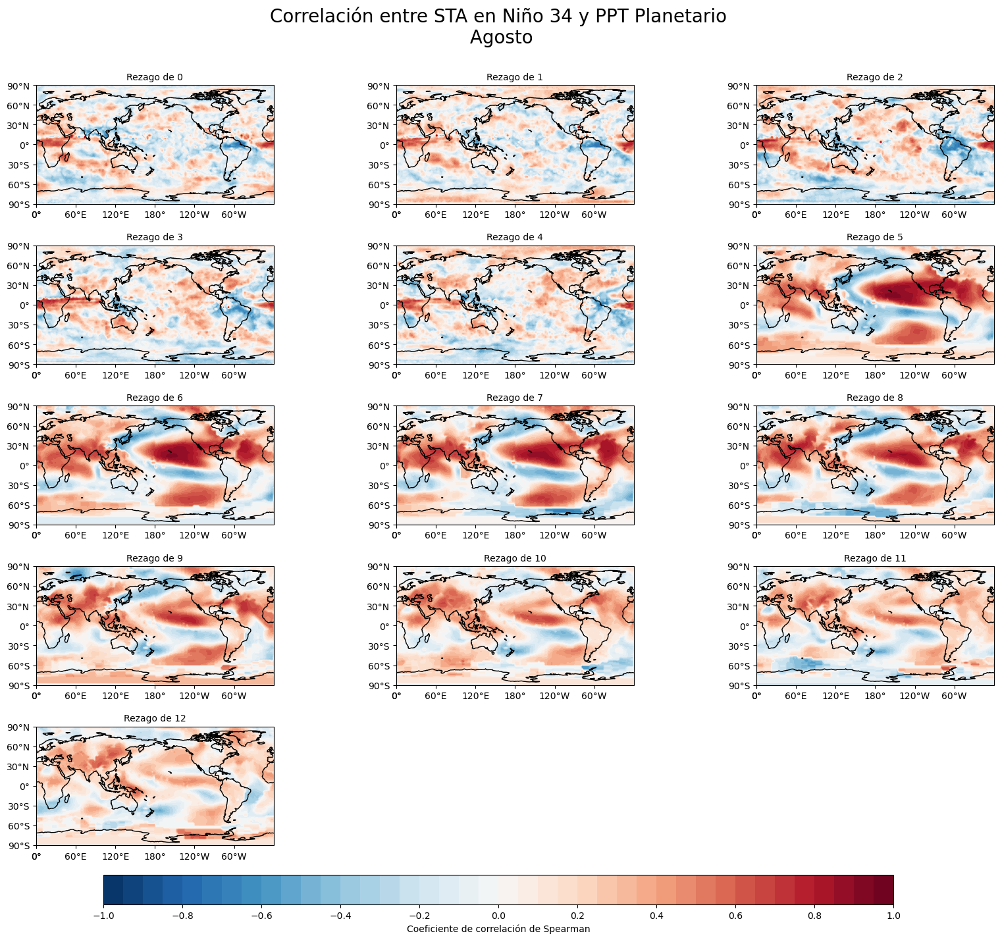

In [59]:
# PRUEBA OTROS MESES
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 8
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 34 y PPT Planetario\n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R3[mes-1,i,:,:], coord=lon)
    #np.roll(Corr_R3[mes-1,i,:,:], int(len(lon) / 2))
    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))



# Mostrar el gráfico
plt.show()

In [39]:
import numpy as np
import scipy.stats as scp

lat = precipFiltrado["lat"]
lon = precipFiltrado["lon"]

Corr_R4 = np.zeros([12, 13, len(lat), len(lon)]) * np.NaN

for k in range(1, 13):
    print("\n", k)
    TempNino_meses = tempMedia.sel(time=(tempMedia.time.dt.month == k) & (tempMedia.time.dt.year <= 2016)).values
    TempNino = TempNino_meses[:-1]
    for Rezago in range(0, 13):
        if 12 - k >= Rezago:
            print(Rezago, k - Rezago)
            #Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k + Rezago) & (tempFiltrado.time.dt.year <= 2015))
            Temp_meses = precipFiltrado.sel(time=(precipFiltrado.time.dt.month == k + Rezago) & (precipFiltrado.time.dt.year <= 2015))
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R4[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R4[k - 1, Rezago, i, j] = 0
        else:
            print(Rezago, k - Rezago)
            Temp_meses = tempFiltrado.sel(time=(tempFiltrado.time.dt.month == k + (Rezago - 12)) & (tempFiltrado.time.dt.year <= 2016))[1:]
            print(len(Temp_meses))
            print(len(TempNino))
            for i in range(len(lat)):
                for j in range(len(lon)):
                    valid_indices = ~np.isnan(Temp_meses[:, i, j]) & ~np.isnan(TempNino)
                    if np.count_nonzero(valid_indices) >= 3:
                        Corr_R4[k - 1, Rezago, i, j] = scp.spearmanr(Temp_meses[valid_indices, i, j], TempNino[valid_indices], nan_policy='omit')[0]
                    else:
                        Corr_R4[k - 1, Rezago, i, j] = 0



 1
0 1
37
37
1 0
37
37
2 -1
37
37
3 -2
37
37
4 -3
37
37
5 -4
37
37
6 -5
37
37
7 -6
37
37
8 -7
37
37
9 -8
37
37
10 -9
37
37
11 -10
37
37
12 -11
37
37

 2
0 2
37
37
1 1
37
37
2 0
37
37
3 -1
37
37
4 -2
37
37
5 -3
37
37
6 -4
37
37
7 -5
37
37
8 -6
37
37
9 -7
37
37
10 -8
37
37
11 -9
37
37
12 -10
37
37

 3
0 3
37
37
1 2
37
37
2 1
37
37
3 0
37
37
4 -1
37
37
5 -2
37
37
6 -3
37
37
7 -4
37
37
8 -5
37
37
9 -6
37
37
10 -7
37
37
11 -8
37
37
12 -9
37
37

 4
0 4
37
37
1 3
37
37
2 2
37
37
3 1
37
37
4 0
37
37
5 -1
37
37
6 -2
37
37
7 -3
37
37
8 -4
37
37
9 -5
37
37
10 -6
37
37
11 -7
37
37
12 -8
37
37

 5
0 5
37
37
1 4
37
37
2 3
37
37
3 2
37
37
4 1
37
37
5 0
37
37
6 -1
37
37
7 -2
37
37
8 -3
37
37
9 -4
37
37
10 -5
37
37
11 -6
37
37
12 -7
37
37

 6
0 6
37
37
1 5
37
37
2 4
37
37
3 3
37
37
4 2
37
37
5 1
37
37
6 0
37
37
7 -1
37
37
8 -2
37
37
9 -3
37
37
10 -4
37
37
11 -5
37
37
12 -6
37
37

 7
0 7
37
37
1 6
37
37
2 5
37
37
3 4
37
37
4 3
37
37
5 2
37
37
6 1
37
37
7 0
37
37
8 -1
37
37
9 -2
37
37
10 -3
37
37
11 -4


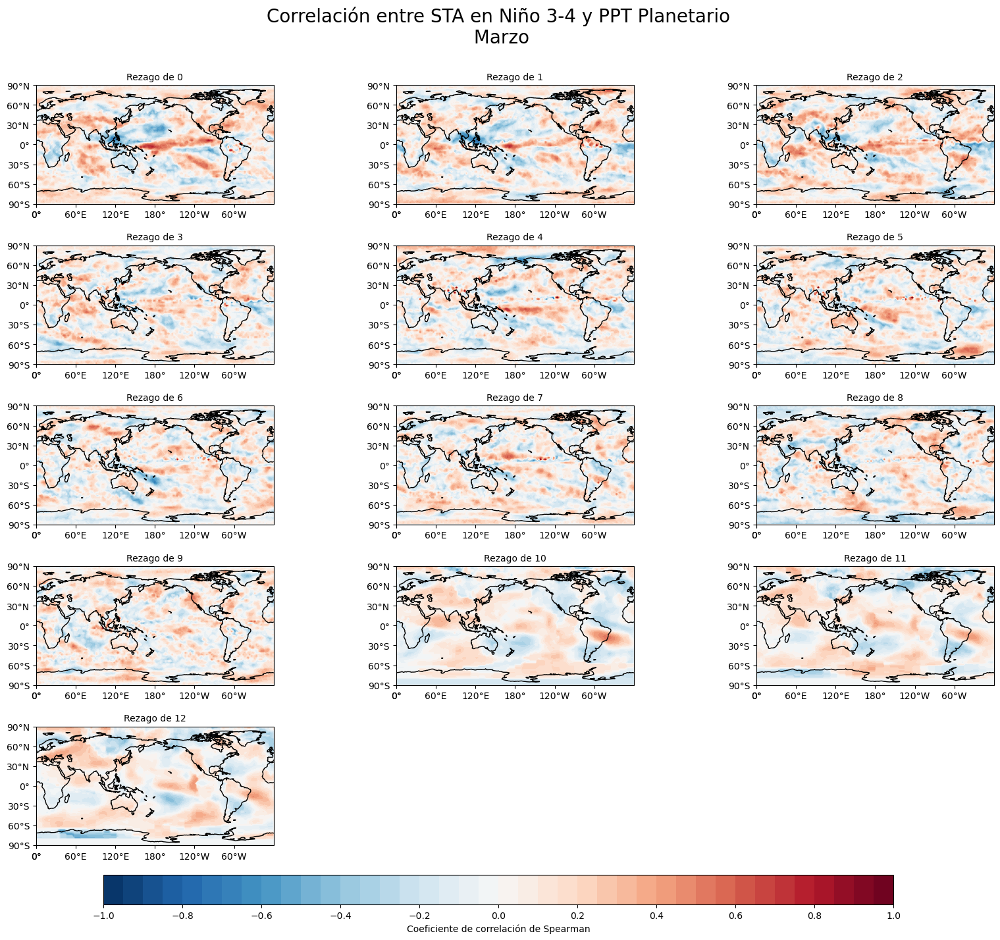

In [60]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 3
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 3-4 y PPT Planetario\n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R4[mes-1,i,:,:], coord=lon)
    #np.roll(Corr_R3[mes-1,i,:,:], int(len(lon) / 2))
    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Nombre de archivo para la figura
nombre_figura = "M2STAniñoPPTplanetaMarzo.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)


# Mostrar el gráfico
plt.show()

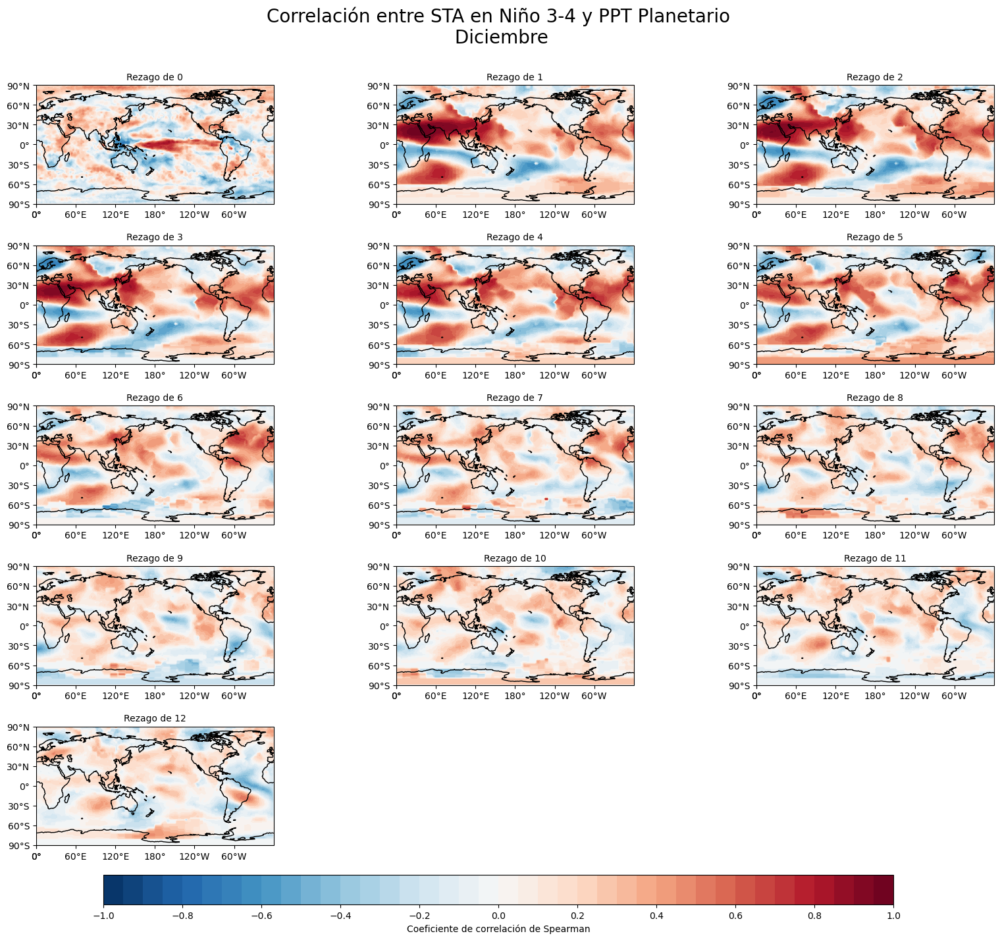

In [61]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 12
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 3-4 y PPT Planetario\n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R4[mes-1,i,:,:], coord=lon)
    #np.roll(Corr_R3[mes-1,i,:,:], int(len(lon) / 2))
    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Nombre de archivo para la figura
nombre_figura = "M2STAniñoPPTplanetaDiciembre.png"
# Guardar el plot en la ruta especificada
plt.savefig(ruta_figuras + nombre_figura, dpi = 500)


# Mostrar el gráfico
plt.show()

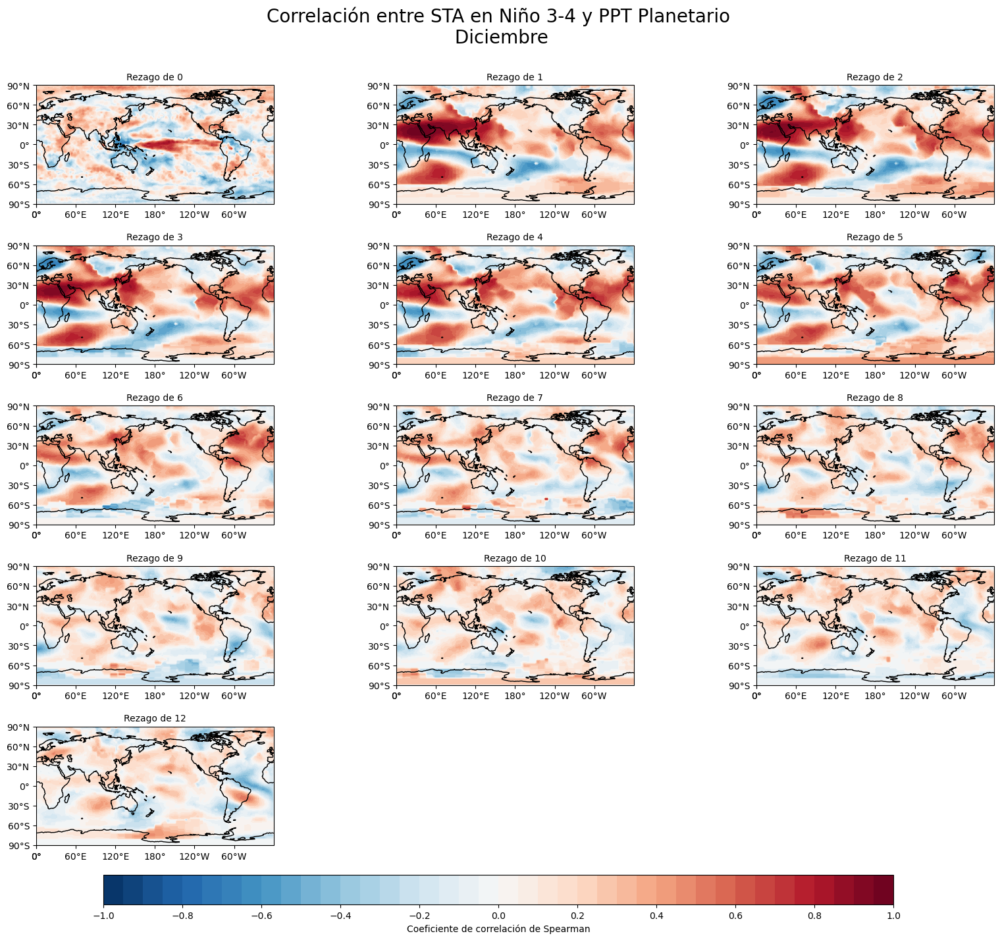

In [52]:
# Obtener los meses como una lista
meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
mes = 12
mexAux = meses[mes-1]

rezagos = np.linspace(0, 12, 13)

vmin = -1
vmax = 1

# Crear la cuadrícula de subplots
fig, axs = plt.subplots(5, 3, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
fig.suptitle('Correlación entre STA en Niño 3-4 y PPT Planetario\n {}'.format(mexAux), fontsize=20, y=0.96)

# Iterar sobre los meses y los subplots
for i in range(0,13):
    # Obtener los datos para el mes actual
    lat = precipFiltrado["lat"]
    lon = precipFiltrado["lon"]
    Mapa, lon = cutil.add_cyclic_point(Corr_R4[mes-1,i,:,:], coord=lon)
    #np.roll(Corr_R3[mes-1,i,:,:], int(len(lon) / 2))
    # Obtener el índice de fila y columna para el subplot actual
    fila = i // 3
    columna = i % 3

    # Configurar el subplot actual
    ax = axs[fila, columna]
    ax.set_extent([np.min(lon), np.max(lon), np.min(lat), np.max(lat)], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='0.9')
    cs = ax.contourf(lon, lat, Mapa, cmap='RdBu_r', transform=ccrs.PlateCarree(), levels=np.linspace(-1, 1, 41), vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, 361, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.coastlines()

    ax.set_title("Rezago de {}".format(i), fontsize=10)

# Ocultar los subplots en la última fila, última columna y penúltima columna
axs[4, 1].axis('off')
axs[4, 2].axis('off')

# Ajustar el espaciado entre los subplots
plt.subplots_adjust(hspace=0.35)  # Ajustar el espacio vertical entre las filas de subfigura

# Posición y tamaño de la barra de colores
cbar_position = [0.2, 0.02, 0.6]

# Agregar una sola barra de color en la parte inferior
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.03])
cbar = plt.colorbar(cs, cax=cbar_ax, orientation='horizontal', label="Coeficiente de correlación de Spearman" )
cbar.set_ticks(np.linspace(-1, 1, 11))

# Mostrar el gráfico